# Neural forecasting models

We will cover neural models for time series forecasting, both trained from scratch and pretrained. We will use varied libraries, depending on the model, for example:
- [sktime](https://www.sktime.net/en/stable/index.html) - general time series processing
- [neuralforecast](https://github.com/Nixtla/neuralforecast) - a lot of neural models for time series, e.g. DLinear, N-BEATS
- [PyTorch](https://pytorch.org/) - deep learning framework
- [timesfm](https://github.com/google-research/timesfm) - official TimesFM implementation (and loading pretrained model)

Use tutorials, quickstarts, GitHub pages etc. of those libraries as necessary.

In [1]:
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

## Datasets and evaluation

We will use 2 datasets:
1. [Italian pasta dataset](https://www.sciencedirect.com/science/article/abs/pii/S0957417421005431?via%3Dihub), same as in the first notebook.
2. [Polish energy production data](https://energy.instrat.pl/en/electrical-system/electricity-production-are/), as published by Energy Instrat and ENTSO-e, from data by PSE (Polskie Sieci Elektroenergetyczne).

Both are multivariate and focused on long-term forecasting.

### Italian pasta

#### Data loading and visualization

This dataset technically multivariate, but it has data from 4 different companies with very different characteristics, so it may have pretty weak cross-series dependencies. We will consider a simplified variant with no exogenous variables.

In [2]:
from sktime.utils.plotting import plot_series


df_pasta = pd.read_csv("italian_pasta.csv")
for num in [1, 2, 3, 4]:
    company_qty_cols = [col for col in df_pasta.columns if col.startswith(f"QTY_B{num}")]
    df_pasta[f"value_B{num}"] = df_pasta[company_qty_cols].sum(axis="columns")

df_pasta = df_pasta.set_index(pd.to_datetime(df_pasta["DATE"])).asfreq("d")
df_pasta = df_pasta[["value_B1", "value_B2", "value_B3", "value_B4"]]
df_pasta

,value_B1,value_B2,value_B3,value_B4
DATE,,,,
2014-01-02,101.0,186.0,32.0,36.0
2014-01-03,136.0,248.0,32.0,27.0
2014-01-04,162.0,264.0,94.0,45.0
2014-01-05,106.0,106.0,18.0,29.0
2014-01-06,47.0,54.0,9.0,11.0
...,...,...,...,...
2018-12-27,203.0,143.0,30.0,39.0
2018-12-28,192.0,187.0,28.0,44.0
2018-12-29,158.0,217.0,44.0,48.0


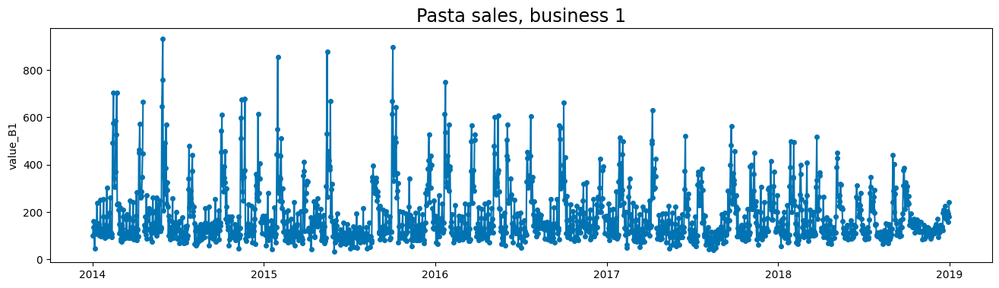

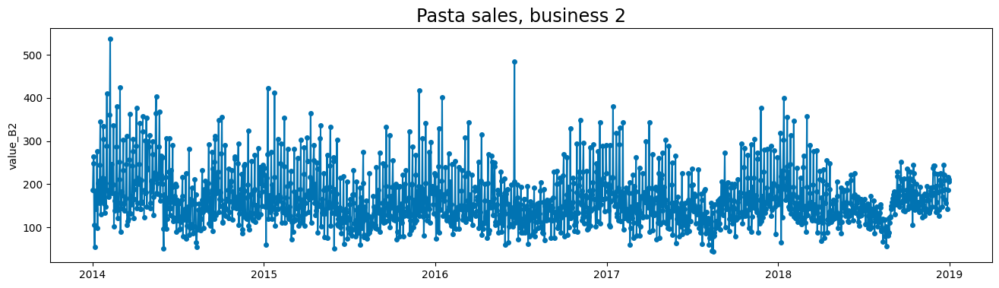

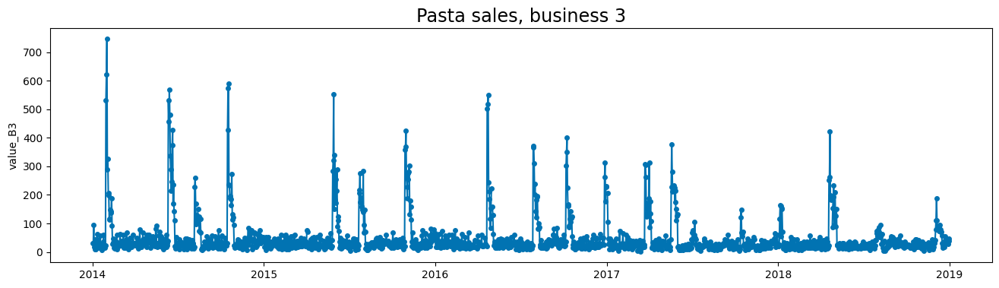

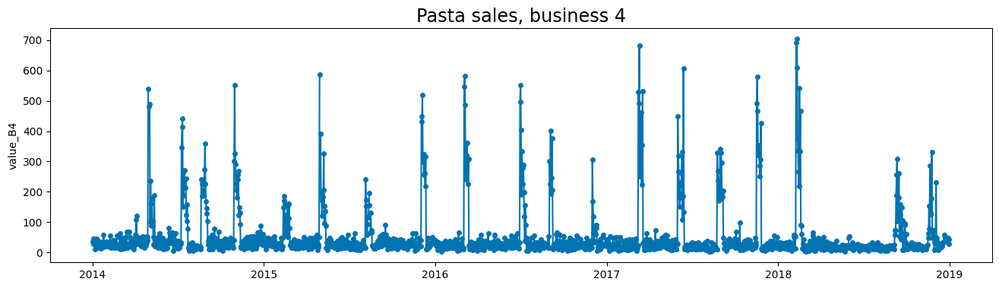

In [3]:
for num in [1, 2, 3, 4]:
    plot_series(df_pasta[f"value_B{num}"], title=f"Pasta sales, business {num}")


#### Evaluation

Similarly to the first notebook, we will be interested in long-term forecasting, predicting the daily sales for 2018, based on previous years. Since we have 4 time series with different scales, MASE is a great metric, since it can be averaged across series.

In [4]:
from sktime.transformations.series.impute import Imputer


df_pasta_train = df_pasta[df_pasta.index < "2018-01-01"]
df_pasta_test = df_pasta[df_pasta.index >= "2018-01-01"]

imputer = Imputer(method="ffill")
df_pasta_train = imputer.fit_transform(df_pasta_train)
df_pasta_test = imputer.transform(df_pasta_test)

print(f"Data size: train {len(df_pasta_train)}, test {len(df_pasta_test)}")

Data size: train 1460, test 365


### Polish energy production

#### Data loading and visualization

Energy mix is composed of multiple energy sources. It typically consists of multiple components:
- slow-changing base, e.g. coal, nuclear
- faster changing and controllable sources, e.g. gas, oil, hydro
- very cheap, but uncontrollably changing renewables, e.g. wind, solar

The resulting production is always limited by the grid efficiency, which is very low in Poland, resulting in e.g. refusing to connect more prosumer solar installations. As such, the production limits are monitored and controlled, and cross-series dependencies are often quite strong.

We will aggregate the energy sources a bit, and consider:
- coal (and derivatives)
- hydro (from all sources)
- solar
- wind
- all others, e.g. oil (petroleum), biomass

Since units are GWh (10^9 Wh, Whatt hours), values are very high, so we will consider thousands of GWh, i.e. TWh (10^12 Wh). It is not a standard unit, but should help with numerical stability for methods that do not perform standardization or scaling.

Data from PSE has changed its format and processing at 13.06.2024, and values since this date are in 15-minutes intervals, compared to 1-hour from before. As such, we divide them by 4, to have the same unit.

If you want to know more about energy production and demand, see e.g. [this video](https://www.youtube.com/watch?v=xhxo2oXRiio) or [this video](https://www.youtube.com/watch?v=GBp_NgrrtPM).

In [5]:
df_energy = pd.read_csv("electricity_production_entsoe_all.csv")
df_energy = df_energy.drop(columns="date_utc")
df_energy["date"] = pd.to_datetime(df_energy["date"], format="%d.%m.%Y %H:%M")
df_energy = df_energy.set_index("date")
df_energy = df_energy.resample("D").sum()

# aggregate energy sources
df_energy["coal"] = (
    df_energy["hard_coal"] + df_energy["coal-derived"] + df_energy["lignite"]
)
df_energy["hydro"] = (
    df_energy["hydro_pumped_storage"] + 
    df_energy["hydro_run-of-river_and_poundage"] + 
    df_energy["hydro_water_reservoir"]
)
df_energy["wind"] = df_energy["wind_onshore"]
df_energy["other"] = (
    df_energy["oil"] + 
    df_energy["biomass"] + 
    df_energy["other"] + 
    df_energy["other_renewable"]
)
df_energy = df_energy[["coal", "gas", "hydro", "wind", "solar", "other"]]

# fix values and change units (GWh -> thousands of GWh)
df_energy[df_energy.index >= "13.06.2024"] /= 4
df_energy["other"][df_energy.index >= "13.06.2024"] /= 2
df_energy = df_energy / 1000

df_energy

,coal,gas,hydro,wind,solar,other
date,,,,,,
2015-01-02,298.90400,10.13800,9.25500,77.61100,0.0000,5.702000
2015-01-03,288.79200,10.25900,9.30400,80.98500,0.0000,5.155000
2015-01-04,271.66200,9.89600,7.83800,77.09600,0.0000,4.175000
2015-01-05,367.48300,10.03000,7.09000,43.30900,0.0000,5.627000
2015-01-06,343.57200,10.26700,7.06800,18.49900,0.0000,5.631000
...,...,...,...,...,...,...
2024-10-30,272.83625,68.80675,4.48175,87.23000,13.5885,16.192750
2024-10-31,252.18300,60.90650,4.63500,111.13200,20.7190,16.189625
2024-11-01,158.76150,43.92125,5.50675,169.88575,23.0975,14.869250


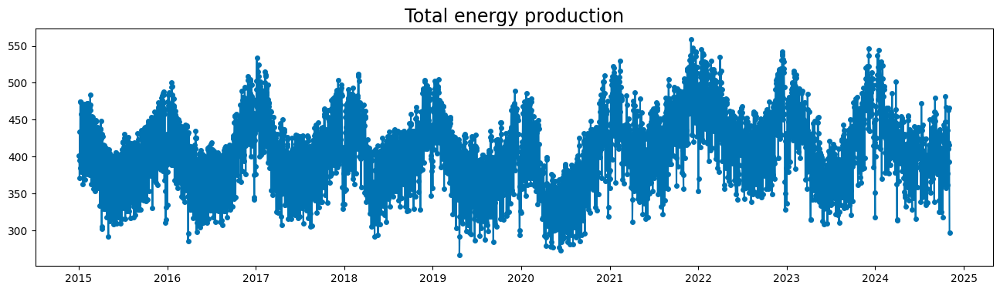

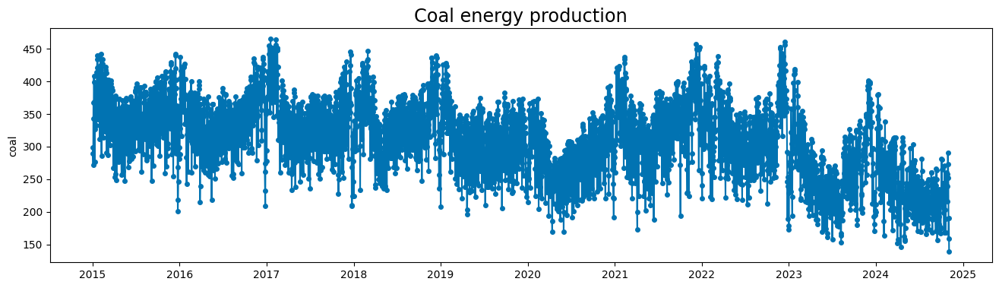

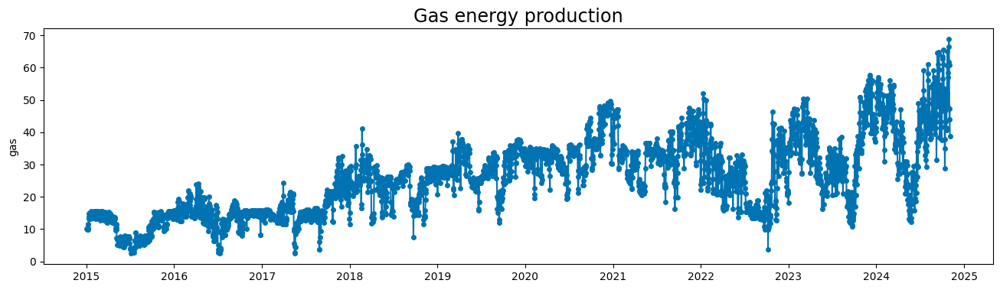

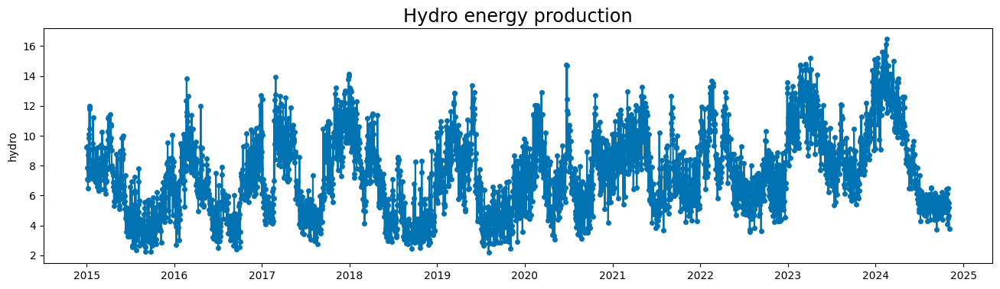

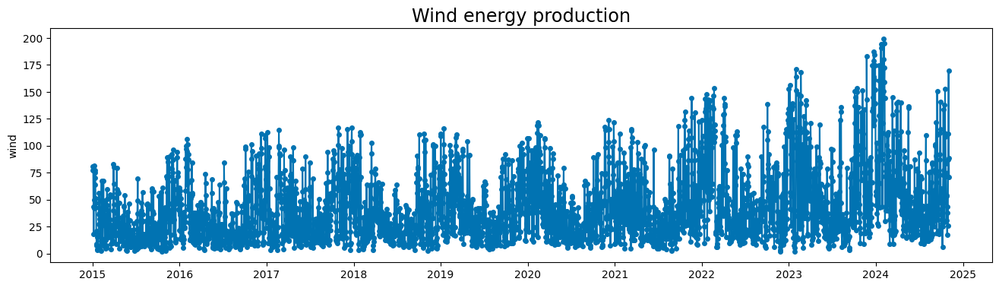

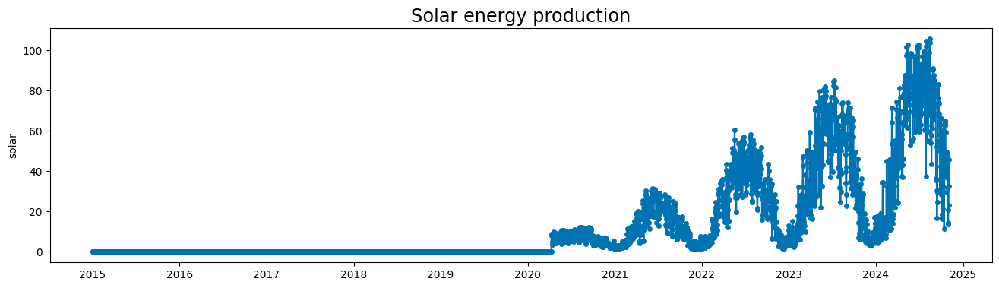

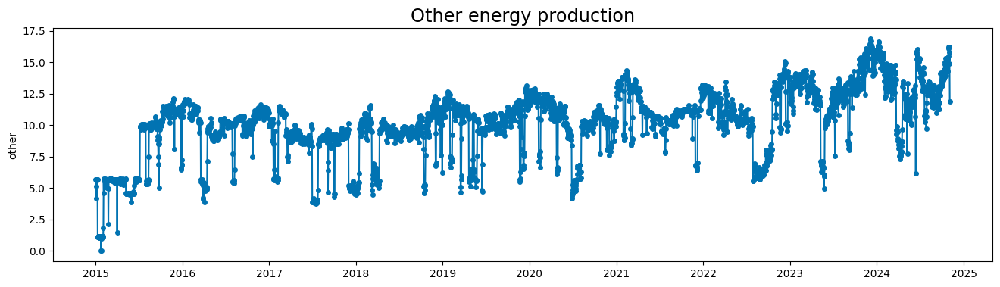

In [6]:
plot_series(df_energy.sum(axis="columns"), title=f"Total energy production")

for col in df_energy.columns:
    plot_series(df_energy[col], title=f"{col.capitalize()} energy production")


#### Evaluation

We will perform long-term forecasting, which is a common task on energy production and demand datasets. We will predict production for 2024, using MASE metric.

In [7]:
from sktime.transformations.series.impute import Imputer

df_energy_train = df_energy[df_energy.index < "2024-01-01"]
df_energy_test = df_energy[df_energy.index >= "2024-01-01"]

print(f"Data size: train {len(df_energy_train)}, test {len(df_energy_test)}")

Data size: train 3286, test 308


## Forecasting

The sub-sections are independent, and can be implemented in any order. The more you do, the more points (and hence the higher mark) you get. They are also more freeform than previous notebook, and there are more options to choose from.

When tuning hyperparameters, choose any strategy you think is reasonable, taking into consideration computational cost and model complexity. Temporal train-valid-test split, time split CV, expanding window - your choice. Even manual tuning is ok, if you think it makes sense, but remember to use the validation set.

You can use any framework and tool you want, but suggestions are provided in further sections. Install additional dependencies as needed, either using Poetry and recreating `poetry lock`, or by directly using `!pip install ...`.

Training and evaluating more models from particular category can get you more points, as described below. If you prefer, you can also experiment with other models, e.g. RNNs, CNN-based, or state-space models (SSMs), adding further sections. Each one by default is worth 2 points.

**Warning:** when making this notebook, some errors with `neuralforecast` cropped up when horizon was greater than 292 for Italian pasta dataset. You can cut the test set at 292 if necessary.

Note that some frameworks (e.g. `neuralforecast`) require "tall"/"long" time series representation, with columns: `unique_id` (time series identifier), `ds` (date) and `y` (actual value). This is in contrast to the "wide" representation, where we have individual series in separate columns, each row with separate date, and values in cells. See e.g. [neuralforecast quickstart](https://nixtlaverse.nixtla.io/neuralforecast/docs/getting-started/quickstart.html#2-loading-airpassengers-data) for an example. Functions prepared below may be useful.

In [8]:
from typing import Optional


def wide_to_long_df(df: pd.DataFrame) -> pd.DataFrame:
    df = pd.melt(df, ignore_index=False).reset_index(names="date")
    df = df.rename(columns={"variable": "unique_id", "date": "ds", "value": "y"})
    return df


def long_to_wide_df(df: pd.DataFrame, values_col: Optional[str] = None) -> pd.DataFrame:
    if "unique_id" not in df.columns:
        df = df.reset_index(names="unique_id")

    values_col = values_col if values_col else df.columns[-1]
    df = pd.pivot(df, columns="unique_id", index="ds", values=values_col)
    return df


### Baselines (2 points)

Implement baselines for neural models:
- last value (naive)
- average
- AutoARIMA
- AutoETS (with damped trend)

Each dataset is worth 1 point. `sktime` will be useful.

In [9]:
df_energy_train_long = df_energy_train.copy()
df_energy_test_long = df_energy_test.copy()
# df_energy_train_long = wide_to_long_df(df_energy_train_long)
# print(df_energy_train_long.head())
df_energy_train_long = df_energy_train_long.loc[:,["coal", "gas", "hydro", "wind", "solar", "other"]]
df_energy_test_long = df_energy_test_long.loc[:,["coal", "gas", "hydro", "wind", "solar", "other"]]

df_energy_train_long_coal = df_energy_train_long.loc[:,["coal"]]
df_energy_test_long_coal = df_energy_test_long.loc[:,["coal"]]
df_energy_train_long_coal = df_energy_train_long_coal['coal']
df_energy_test_long_coal = df_energy_test_long_coal["coal"]
# print(df_energy_train_long_coal)

def get_data_for(label):
    df_train = df_energy_train_long.loc[:,[label]]
    df_test = df_energy_test_long.loc[:,[label]]
    return df_train[label], df_test[label]

In [10]:
def plot_multi_series(data, y_pred, labels):
    y_true = data.loc[y_pred.index]
    for label in labels:
        data_series = data[label]
        y_pred_series = y_pred[label]
        plot_series(data_series, y_pred_series, labels=["y", "y_pred"])
        plt.show()
        plt.clf()

def test_multi_series(data, residuals, labels):
    for label in labels:
        residuals_series = residuals[label]

        anderson_test = anderson(residuals_series)
        print(f"Anderson-Darling test: {anderson_test}")
        print("=========================================")
        ljung_box_test = acorr_ljungbox(residuals_series, lags=[12], return_df=True)
        print(f"Ljung-Box test: {ljung_box_test}")

In [11]:
from scipy.stats import anderson
from sktime.forecasting.model_evaluation import evaluate
from sktime.performance_metrics.forecasting import (
    MeanAbsoluteScaledError,
    MeanAbsoluteError,
    MeanAbsolutePercentageError,
)
from sktime.forecasting.model_selection import ExpandingWindowSplitter
from statsmodels.stats.diagnostic import acorr_ljungbox


def evaluate_model(
    model,
    data: pd.Series,
    horizon: int = 1,
    plot_forecasts: bool = False,
    analyze_residuals: bool = False,
) -> None:
    cv = ExpandingWindowSplitter(fh=np.arange(1, horizon+1), initial_window=int(len(data)-horizon), step_length=horizon)
    metrics = [MeanAbsoluteError(), MeanAbsoluteScaledError(), MeanAbsolutePercentageError()]
    results = evaluate(model, cv, data, scoring=metrics, return_data=True)
    mae = round(np.mean(results["test_MeanAbsoluteError"]), 2)
    mase = round(np.mean(results["test_MeanAbsoluteScaledError"]), 2)

    print(f"MAE: {mae:.2f}")
    print(f"MASE: {mase:.2f}")
    
    y_pred = pd.concat(results["y_pred"].values)
    y_pred = y_pred.sort_index()

    if plot_forecasts:
        plot_multi_series(data, y_pred, data.columns)
    
    if analyze_residuals:
        y_true = data.loc[y_pred.index]
        residuals = y_true - y_pred
        residuals.hist(bins=20)
        plt.title("Histogram of residuals")
        plt.show()

        test_multi_series(data, residuals, data.columns)
        

In [12]:
from sktime.forecasting.naive import NaiveForecaster
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.statsforecast import StatsForecastAutoETS, StatsForecastAutoARIMA


def forecast_for_df(df_train, df_test):
    day_period = len(df_test)
    print("Naive forecast: last")
    model_naive = NaiveForecaster(strategy="last", sp=365)
    evaluate_model(model_naive, df_train, horizon=day_period, plot_forecasts=True, analyze_residuals=True)

    print("Naive forecast: mean")
    model_mean = NaiveForecaster(strategy="mean", sp=365)
    evaluate_model(model_mean, df_train, horizon=day_period, plot_forecasts=True, analyze_residuals=True)

    print("AutoARIMA:")
    model_arima = StatsForecastAutoARIMA(sp=31)
    evaluate_model(model_arima, df_train, horizon=day_period, plot_forecasts=True, analyze_residuals=True)

    print("AutoETS:")
    model_ets = StatsForecastAutoETS(damped=True, season_length=365)
    evaluate_model(model_ets, df_train, horizon=day_period, plot_forecasts=True, analyze_residuals=True)

Naive forecast: last
MAE: 23.78
MASE: 2.63


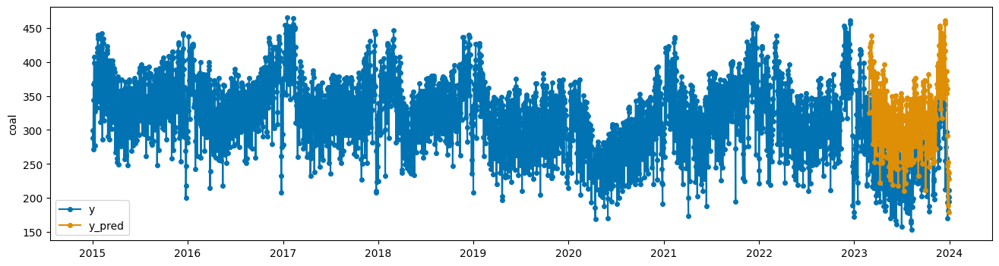

<Figure size 640x480 with 0 Axes>

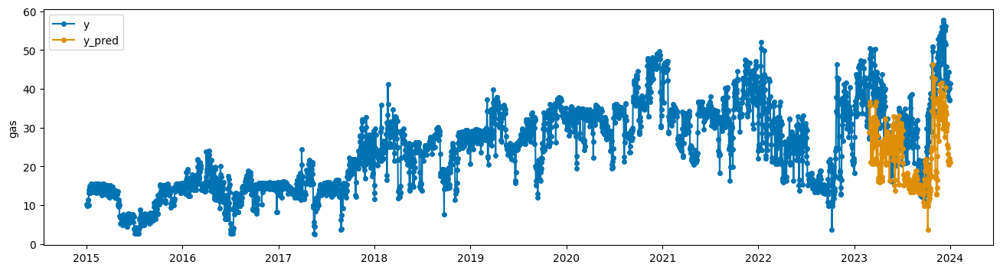

<Figure size 640x480 with 0 Axes>

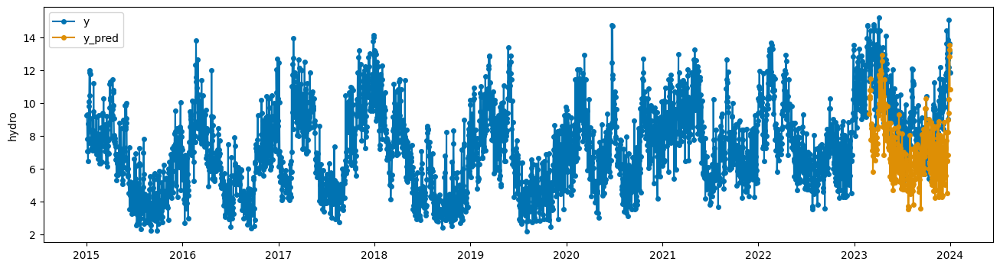

<Figure size 640x480 with 0 Axes>

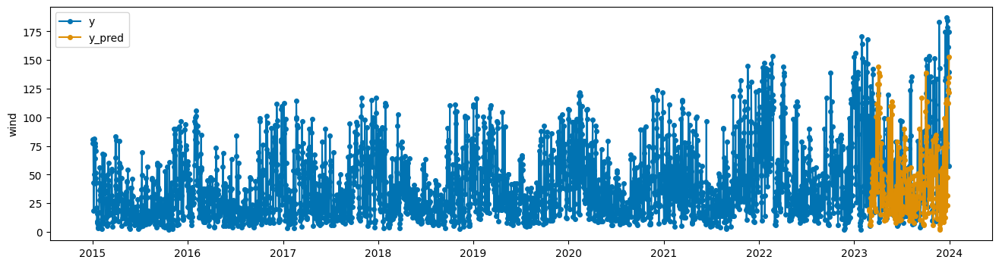

<Figure size 640x480 with 0 Axes>

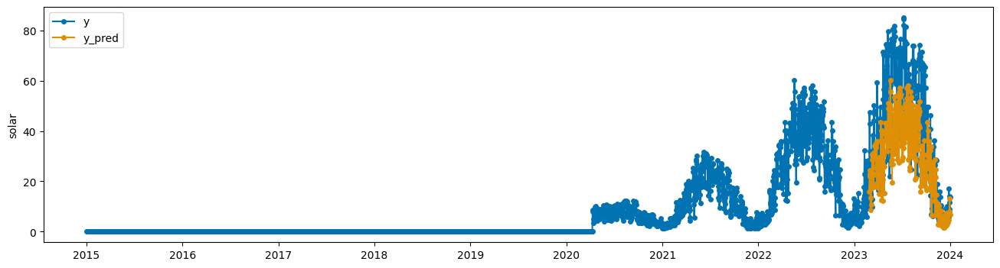

<Figure size 640x480 with 0 Axes>

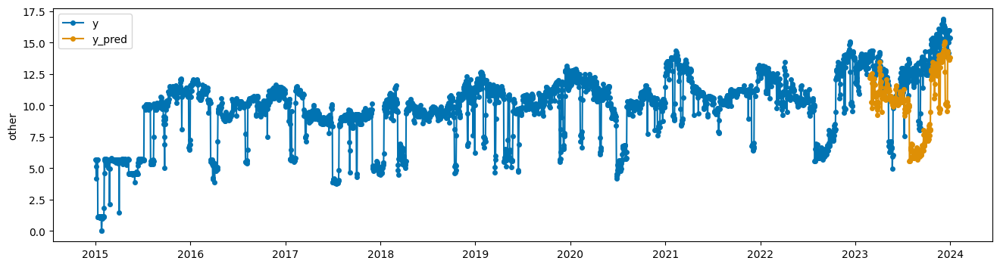

<Figure size 640x480 with 0 Axes>

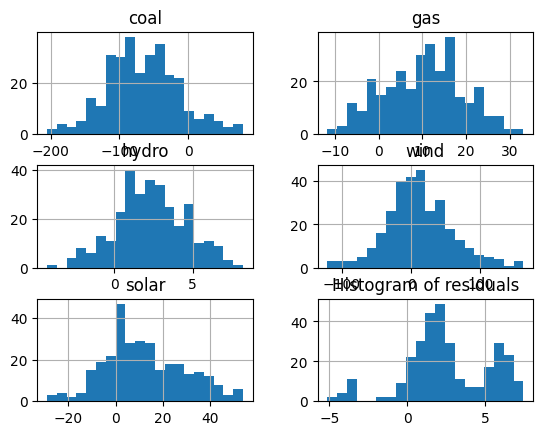

Anderson-Darling test: AndersonResult(statistic=0.511819933572724, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-65.71621753246754, scale=52.282421737559716)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  161.944158  2.109034e-28
Anderson-Darling test: AndersonResult(statistic=0.7782673101467594, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=10.17426948051948, scale=9.056956661206584)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:       lb_stat      lb_pvalue
12  934.17814  2.619844e-192
Anderson-Darling test: AndersonResult(statistic=0.39189552596758404, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=a

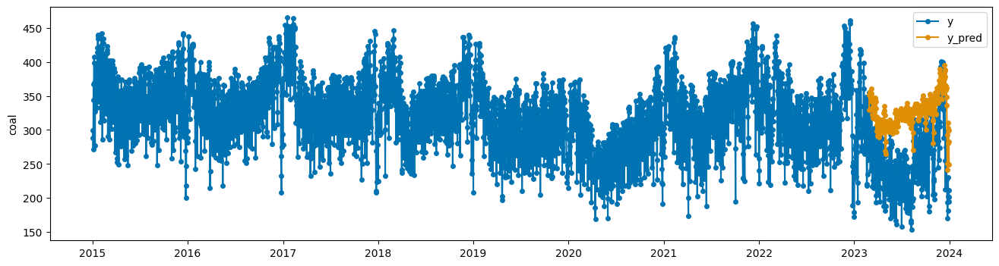

<Figure size 640x480 with 0 Axes>

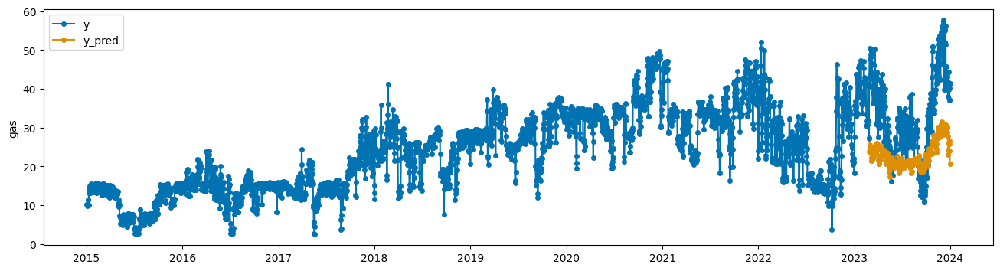

<Figure size 640x480 with 0 Axes>

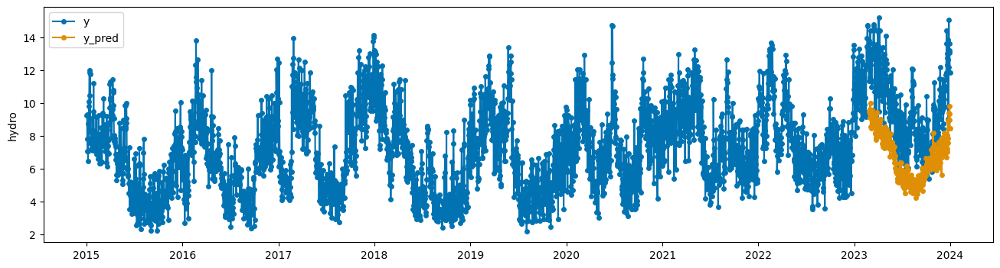

<Figure size 640x480 with 0 Axes>

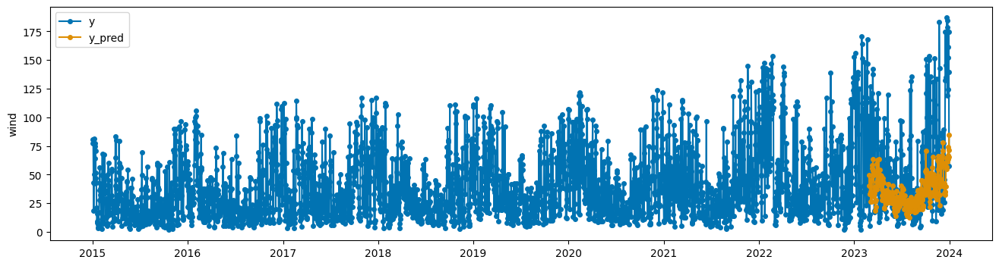

<Figure size 640x480 with 0 Axes>

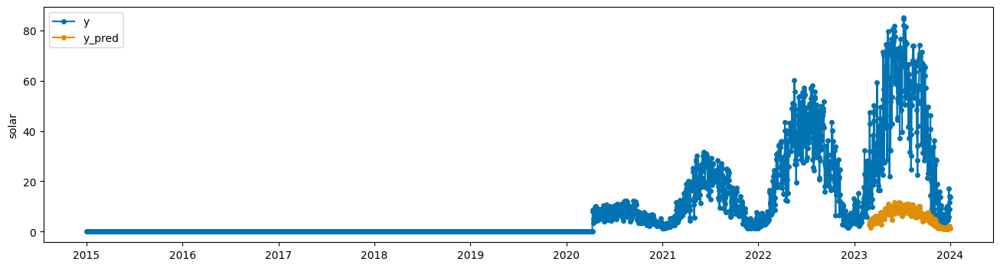

<Figure size 640x480 with 0 Axes>

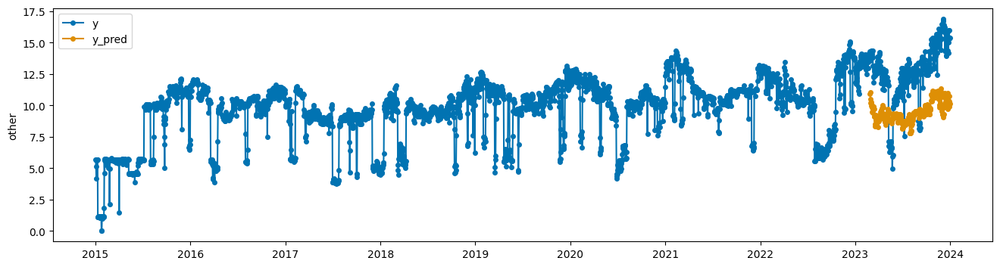

<Figure size 640x480 with 0 Axes>

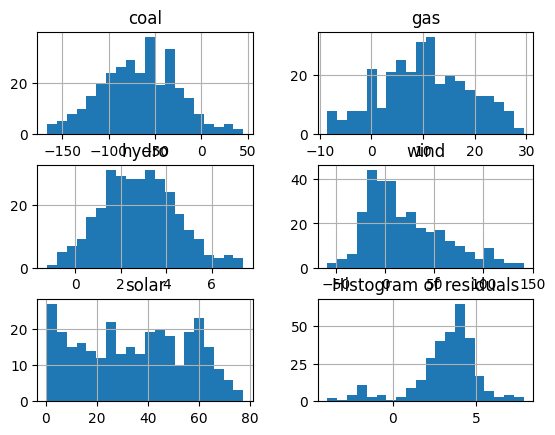

Anderson-Darling test: AndersonResult(statistic=0.20441094095303924, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-66.90082557720056, scale=41.52517445445183)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  273.782097  1.471309e-51
Anderson-Darling test: AndersonResult(statistic=0.4743681161717177, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=10.312511093073592, scale=8.54489120914126)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:         lb_stat  lb_pvalue
12  1711.863171        0.0
Anderson-Darling test: AndersonResult(statistic=0.30412924596129187, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=arra

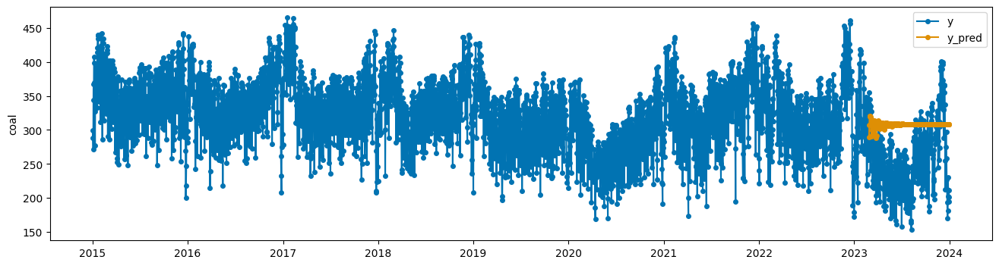

<Figure size 640x480 with 0 Axes>

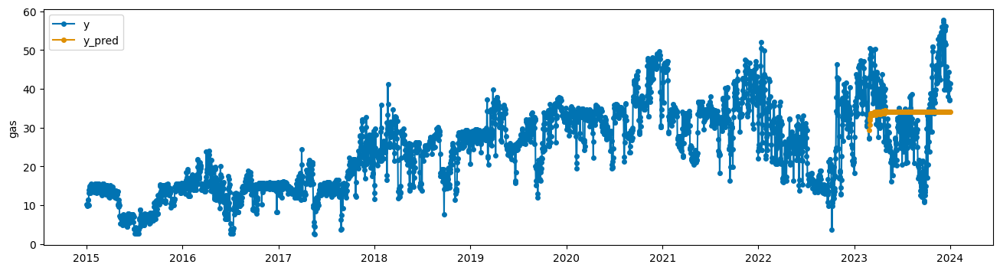

<Figure size 640x480 with 0 Axes>

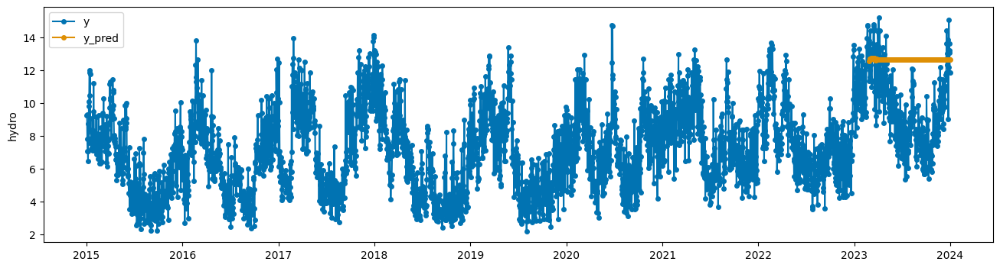

<Figure size 640x480 with 0 Axes>

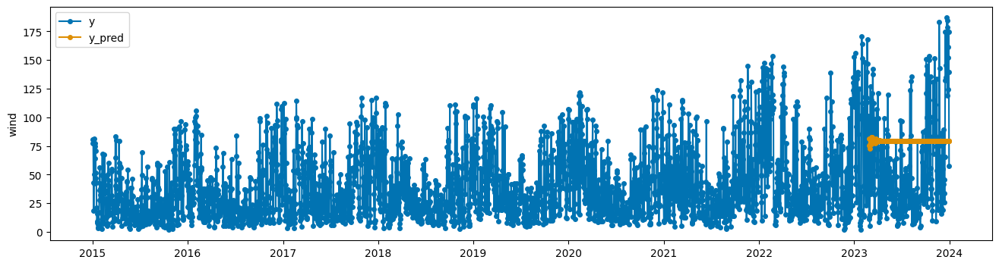

<Figure size 640x480 with 0 Axes>

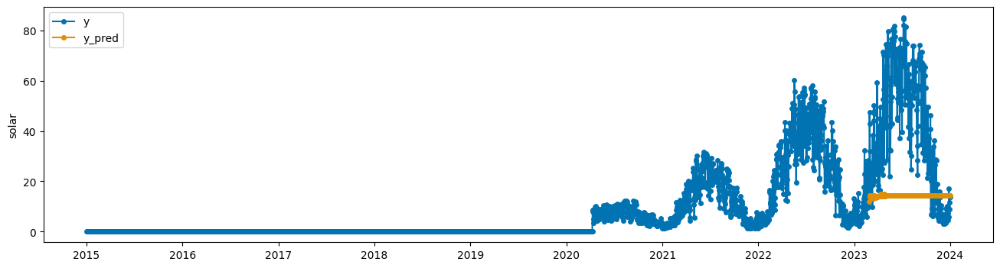

<Figure size 640x480 with 0 Axes>

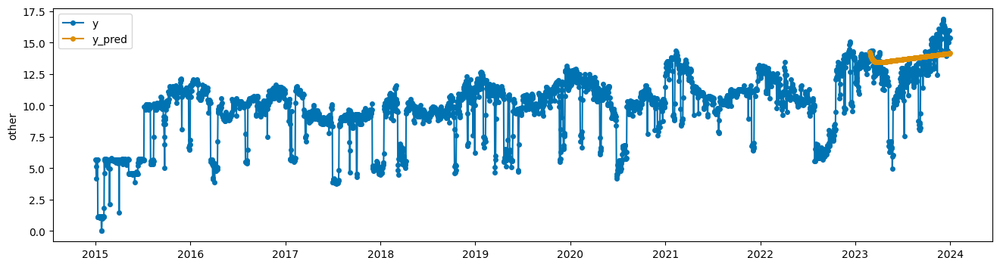

<Figure size 640x480 with 0 Axes>

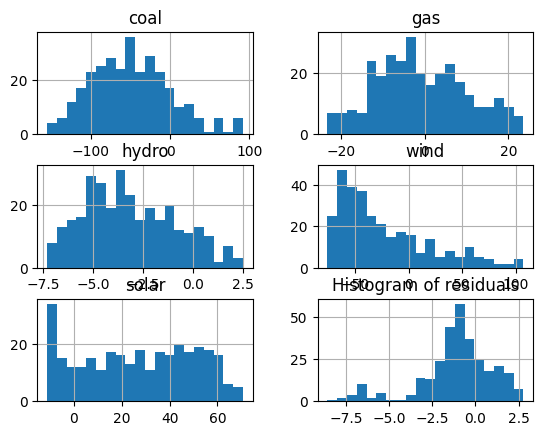

Anderson-Darling test: AndersonResult(statistic=0.8402534968523128, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-48.638344471488985, scale=50.44294337135307)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat      lb_pvalue
12  697.204648  1.748479e-141
Anderson-Darling test: AndersonResult(statistic=1.1386385428876338, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-0.6574363398158227, scale=10.893194651406052)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:         lb_stat  lb_pvalue
12  2307.689015        0.0
Anderson-Darling test: AndersonResult(statistic=2.1885943270104917, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=

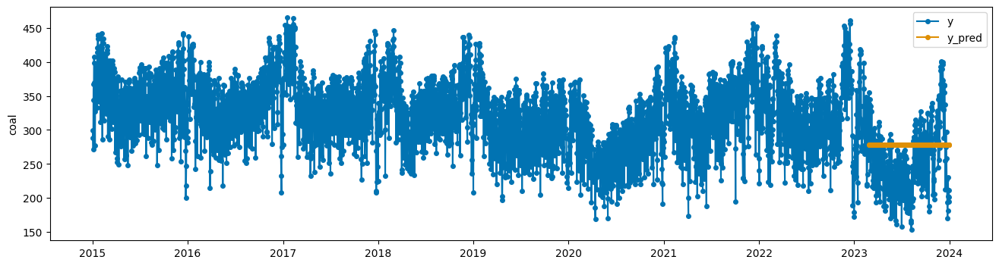

<Figure size 640x480 with 0 Axes>

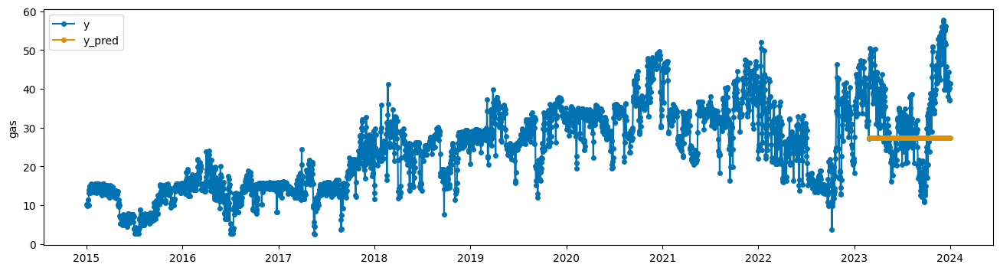

<Figure size 640x480 with 0 Axes>

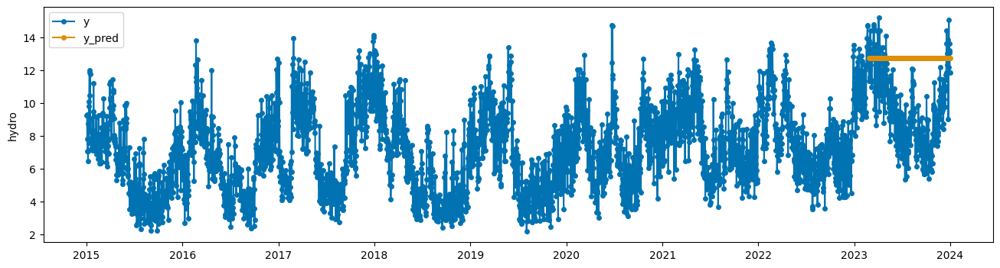

<Figure size 640x480 with 0 Axes>

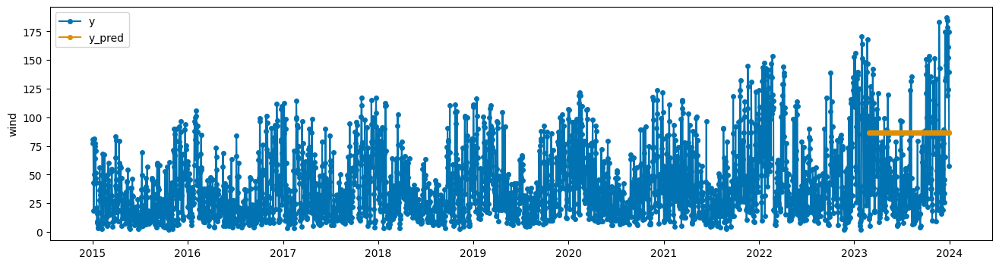

<Figure size 640x480 with 0 Axes>

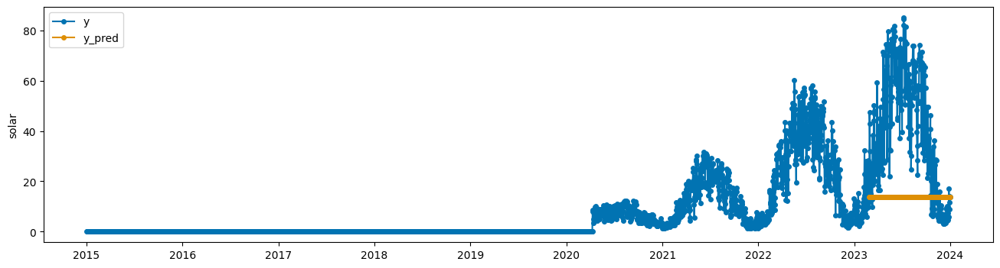

<Figure size 640x480 with 0 Axes>

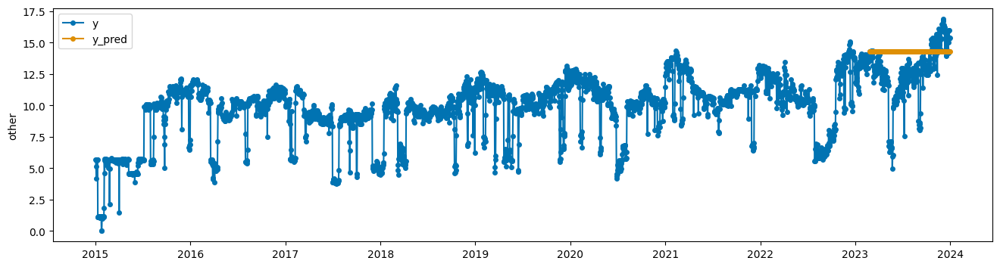

<Figure size 640x480 with 0 Axes>

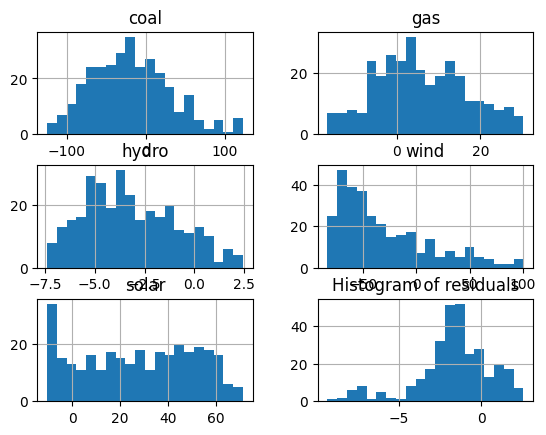

Anderson-Darling test: AndersonResult(statistic=0.8624884375002466, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-18.472573647051668, scale=50.56114274922523)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat      lb_pvalue
12  698.269407  1.034558e-141
Anderson-Darling test: AndersonResult(statistic=1.0017465569684987, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=5.918572104324896, scale=10.793412036312583)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:         lb_stat  lb_pvalue
12  2316.548681        0.0
Anderson-Darling test: AndersonResult(statistic=2.20254853575193, critical_values=array([0.569, 0.648, 0.777, 0.906, 1.078]), significance_level=arra

In [13]:
forecast_for_df(df_energy_train, df_energy_test)

Naive forecast: last
MAE: 65.49
MASE: 1.49


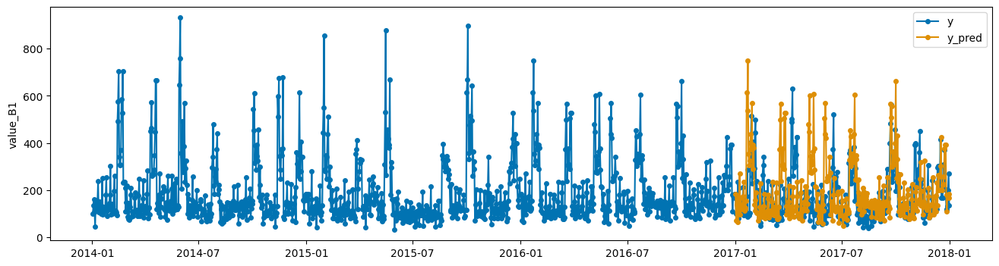

<Figure size 640x480 with 0 Axes>

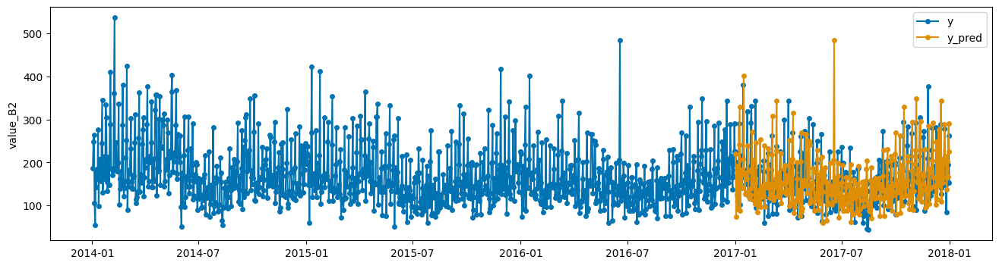

<Figure size 640x480 with 0 Axes>

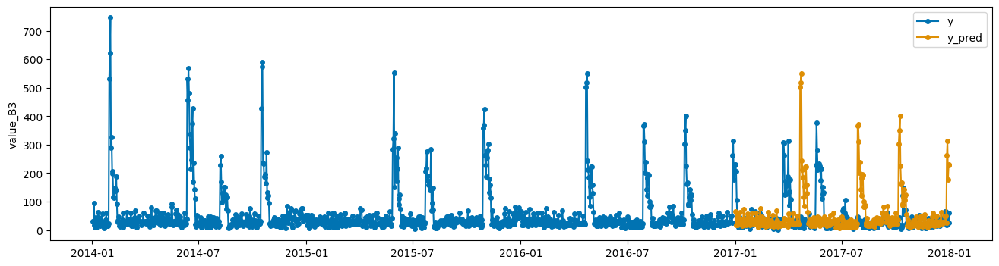

<Figure size 640x480 with 0 Axes>

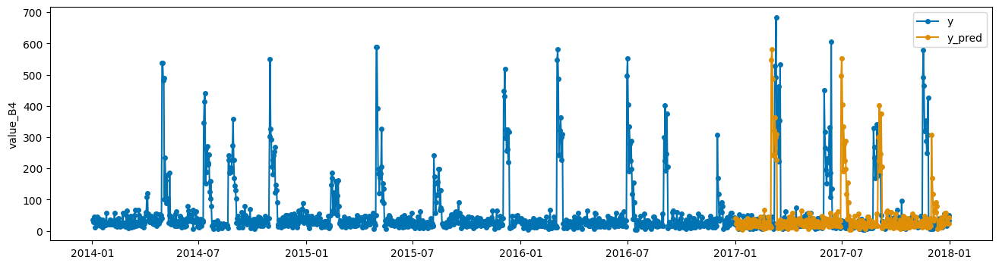

<Figure size 640x480 with 0 Axes>

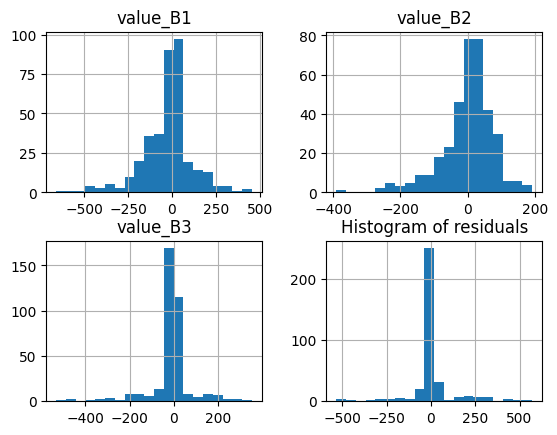

Anderson-Darling test: AndersonResult(statistic=8.436174153820787, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-25.312328767123287, scale=143.35367385987144)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  343.114171  3.974979e-66
Anderson-Darling test: AndersonResult(statistic=6.779722953294254, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=1.4136986301369863, scale=77.10583085922454)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  186.807565  1.704182e-33
Anderson-Darling test: AndersonResult(statistic=39.577212193961145, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=a

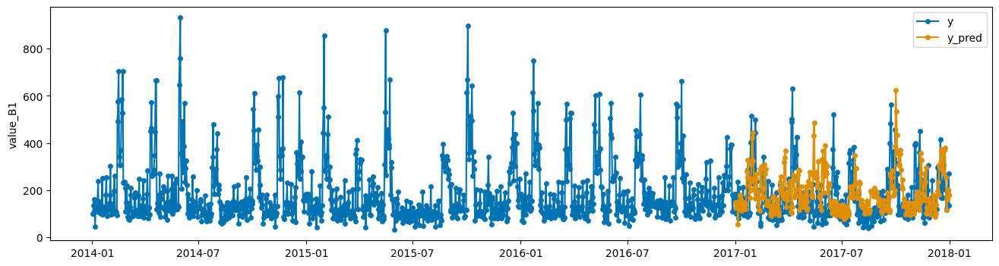

<Figure size 640x480 with 0 Axes>

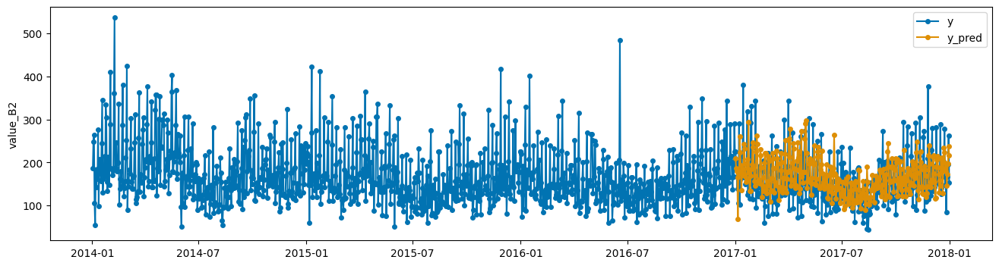

<Figure size 640x480 with 0 Axes>

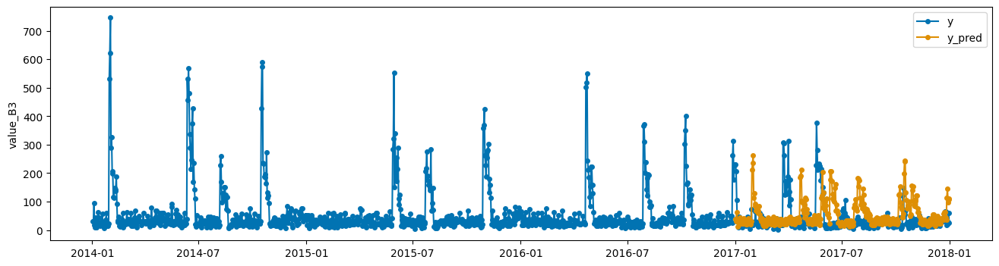

<Figure size 640x480 with 0 Axes>

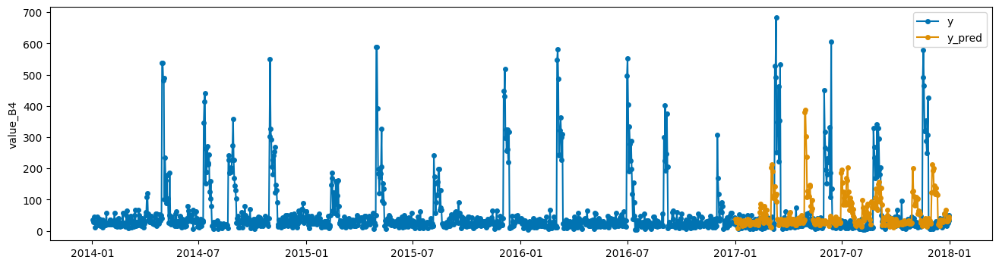

<Figure size 640x480 with 0 Axes>

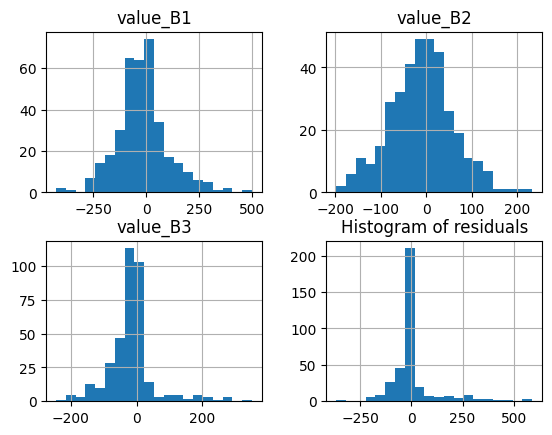

Anderson-Darling test: AndersonResult(statistic=3.519166278207649, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-18.263926940639273, scale=123.14519133430032)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  347.343416  5.098132e-67
Anderson-Darling test: AndersonResult(statistic=0.49906156563633886, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-10.548858447488584, scale=69.54832344728518)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  292.045321  2.193350e-55
Anderson-Darling test: AndersonResult(statistic=18.787148576226855, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_leve

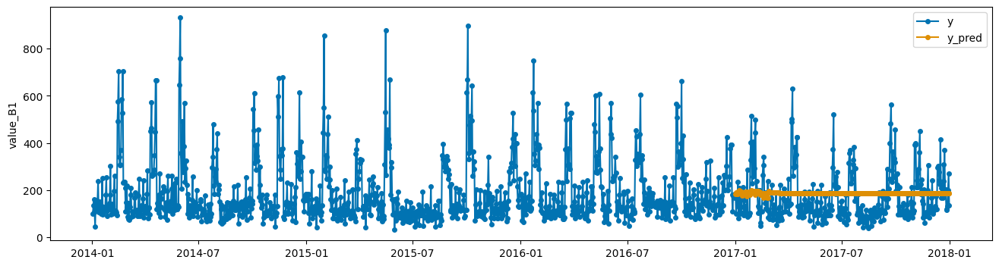

<Figure size 640x480 with 0 Axes>

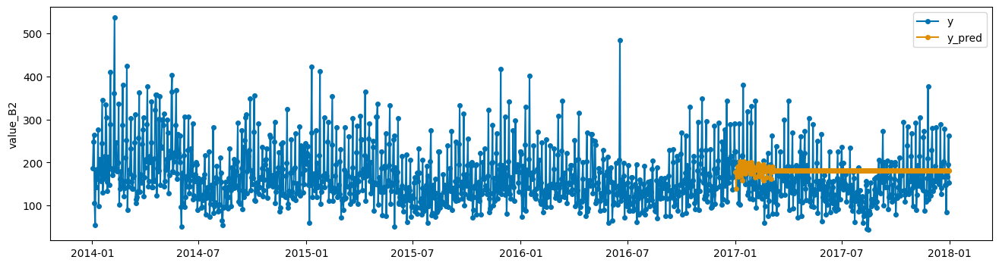

<Figure size 640x480 with 0 Axes>

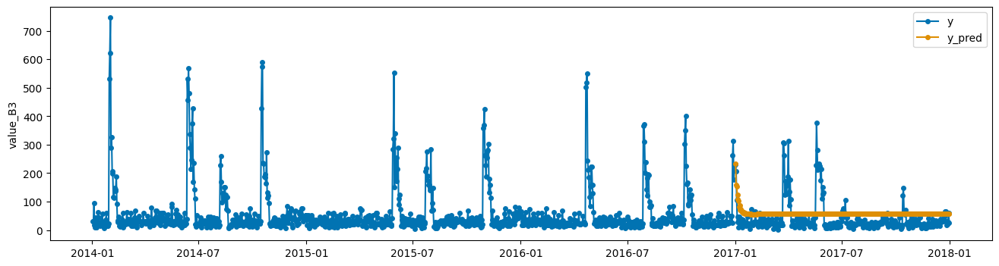

<Figure size 640x480 with 0 Axes>

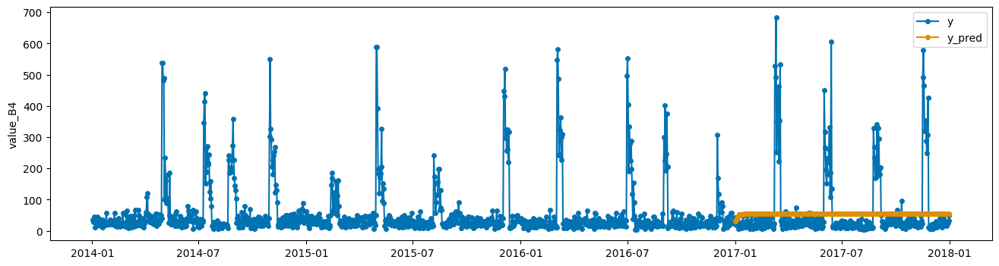

<Figure size 640x480 with 0 Axes>

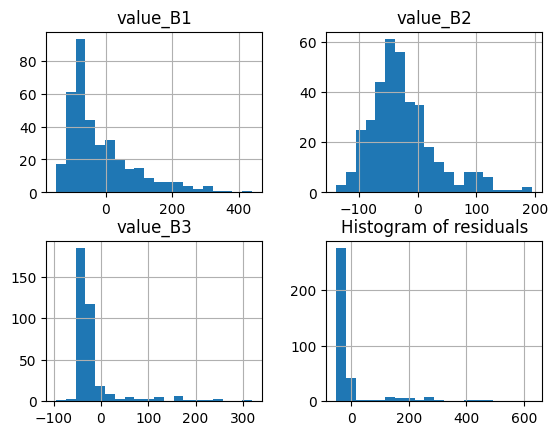

Anderson-Darling test: AndersonResult(statistic=17.91134725157383, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-17.852034037482845, scale=102.51249127636963)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  470.596711  3.975788e-93
Anderson-Darling test: AndersonResult(statistic=6.527086148618821, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-24.734371395356845, scale=55.77113433603761)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  191.502594  1.842113e-34
Anderson-Darling test: AndersonResult(statistic=59.22293232563845, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=a

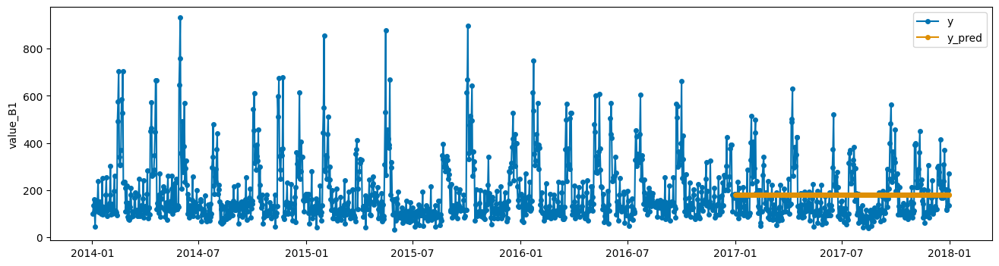

<Figure size 640x480 with 0 Axes>

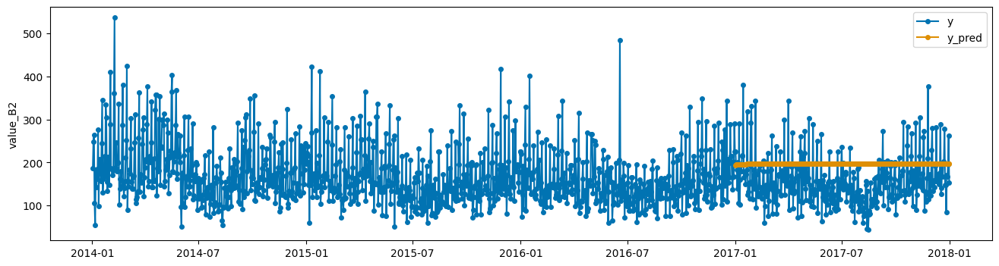

<Figure size 640x480 with 0 Axes>

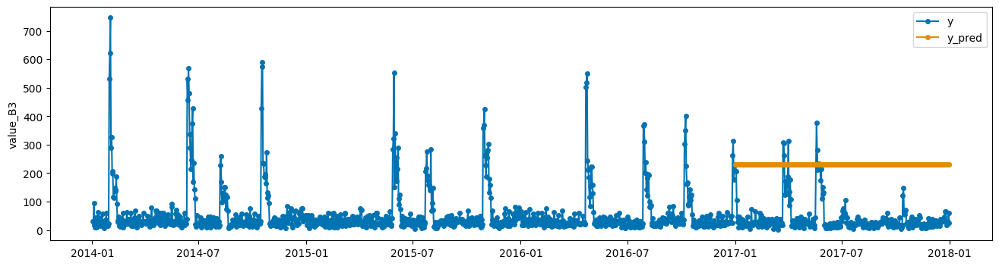

<Figure size 640x480 with 0 Axes>

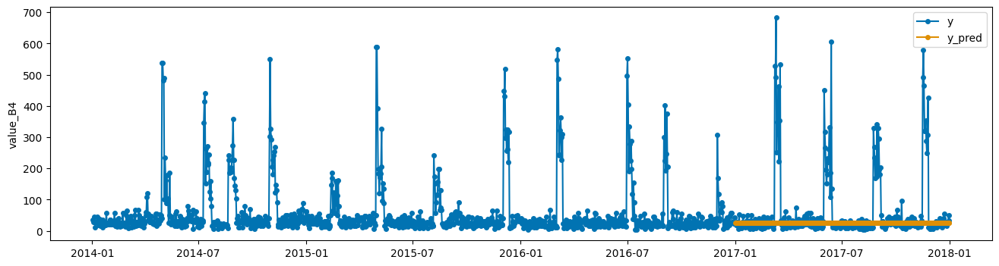

<Figure size 640x480 with 0 Axes>

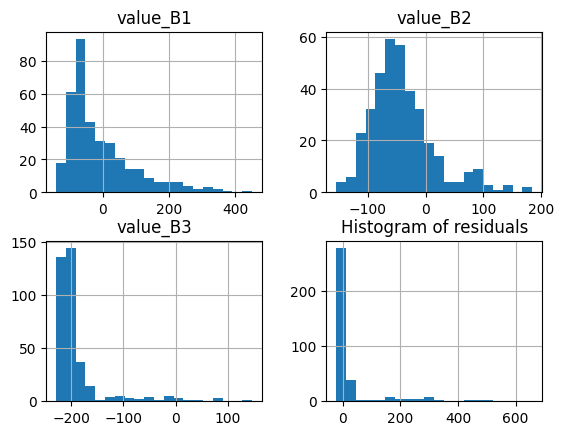

Anderson-Darling test: AndersonResult(statistic=18.078099691953184, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-8.771437425448973, scale=102.6351424531269)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  472.903575  1.285485e-93
Anderson-Darling test: AndersonResult(statistic=6.738003682103226, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=array([15. , 10. ,  5. ,  2.5,  1. ]), fit_result=  params: FitParams(loc=-39.91391248330254, scale=55.92104768185974)
 success: True
 message: '`anderson` successfully fit the distribution to the data.')
Ljung-Box test:        lb_stat     lb_pvalue
12  198.268819  7.424210e-36
Anderson-Darling test: AndersonResult(statistic=61.087683543010485, critical_values=array([0.57 , 0.649, 0.779, 0.908, 1.08 ]), significance_level=ar

In [14]:
forecast_for_df(df_pasta_train, df_pasta_test)

### Linear models (2 points)

Implement linear neural models:
- multioutput linear regression
- LTSF Linear
- LTSF DLinear
- LTSF NLinear

Note that Linear is a multi-channel model, while multioutput linear regression is single-channel.

Tune the lookback window, the only hyperparameter of those models, or justify your choice in a comment if you don't. You can check the papers for reasonable values.

If you use a given model, train it on both datasets. Each model is worth 0.5 points. Useful libraries: `sktime`, `neuralforecast`, PyTorch.

Useful references:
- ["Are Transformers Effective for Time Series Forecasting?" A. Zeng et al.](https://arxiv.org/abs/2205.13504) ([GitHub code](https://github.com/cure-lab/LTSF-Linear))
- ["An Analysis of Linear Time Series Forecasting Models" W.Toner, L. Darlow](https://arxiv.org/abs/2403.14587) ([GitHub code](https://github.com/sir-lab/linear-forecasting))

In [15]:
from sktime.forecasting.ltsf import LTSFLinearForecaster
from sktime.forecasting.ltsf import LTSFDLinearForecaster
from sktime.forecasting.ltsf import LTSFNLinearForecaster 

In [16]:
def train_linear_models(df, df_train, df_test):
    fhorizon = ForecastingHorizon(df_test.index, is_relative=False)
    seq_len = len(df_train) - len(df_test)
    pred_len = len(df_test)

    print("LTSFLinearForecaster: ")
    model = LTSFLinearForecaster(seq_len , pred_len)
    model.fit(df_train, fh=fhorizon)
    y_pred = model.predict()
    print("score: ", model.score(df_test, y_pred))
    plot_multi_series(df, y_pred, df.columns)

    print("LTSFDLinearForecaster: ")
    model = LTSFDLinearForecaster(seq_len , pred_len)
    model.fit(df_train, fh=fhorizon)
    y_pred = model.predict()
    print("score: ", model.score(df_test, y_pred))
    plot_multi_series(df, y_pred, df.columns)

    print("LTSFNLinearForecaster: ")
    model = LTSFNLinearForecaster(seq_len , pred_len)
    model.fit(df_train, fh=fhorizon)
    y_pred = model.predict()
    print("score: ", model.score(df_test, y_pred))
    plot_multi_series(df, y_pred, df.columns)

LTSFLinearForecaster: 
score:  0.6431191094522157


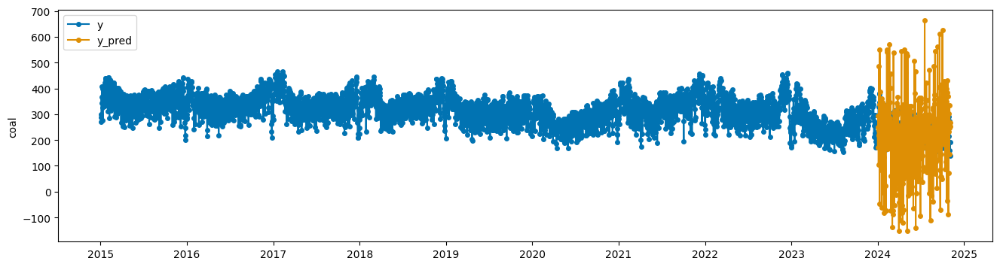

<Figure size 640x480 with 0 Axes>

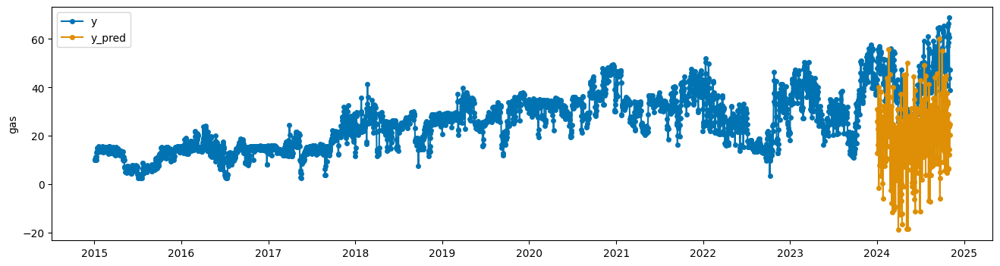

<Figure size 640x480 with 0 Axes>

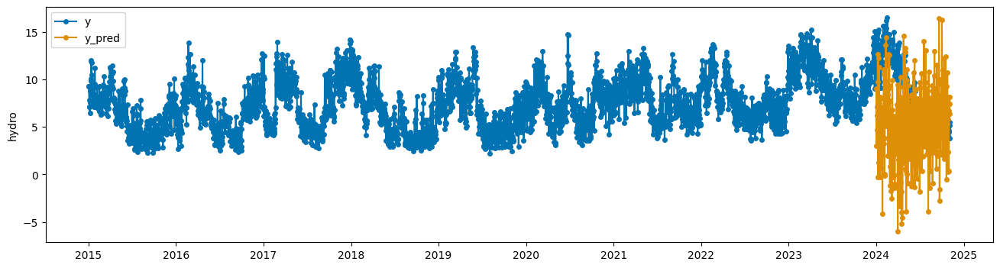

<Figure size 640x480 with 0 Axes>

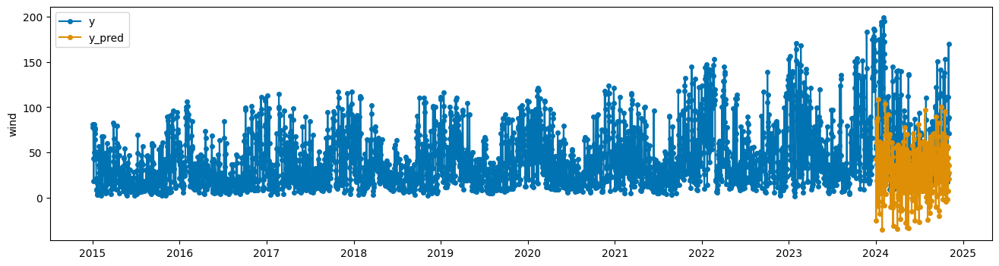

<Figure size 640x480 with 0 Axes>

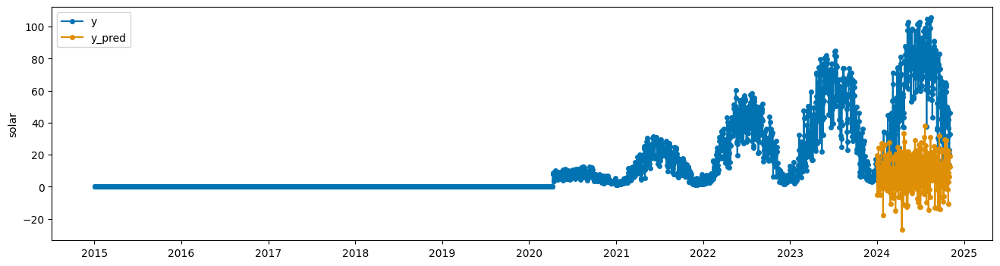

<Figure size 640x480 with 0 Axes>

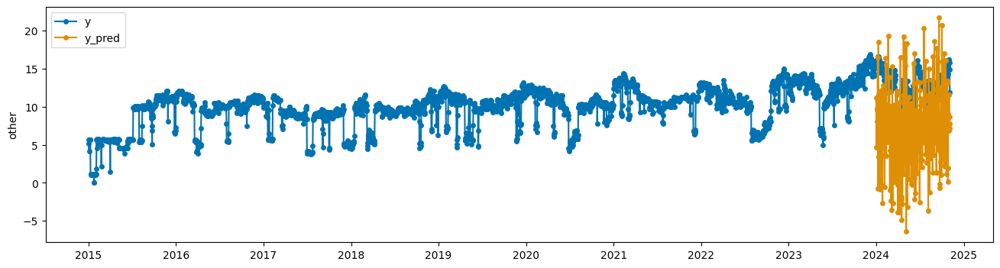

LTSFDLinearForecaster: 
score:  0.6348828831752518


<Figure size 640x480 with 0 Axes>

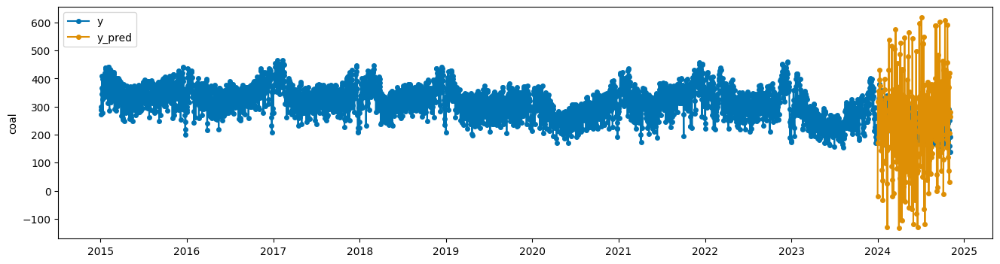

<Figure size 640x480 with 0 Axes>

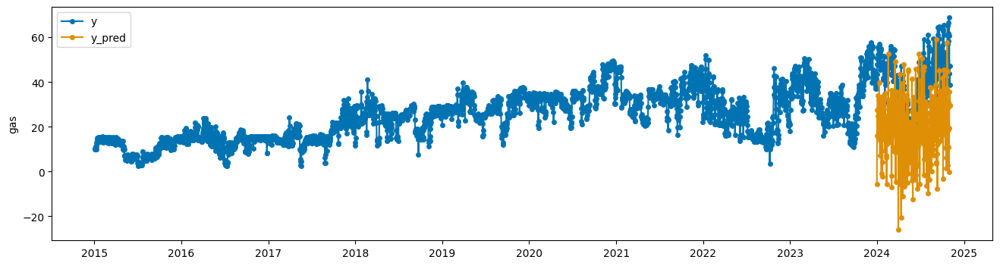

<Figure size 640x480 with 0 Axes>

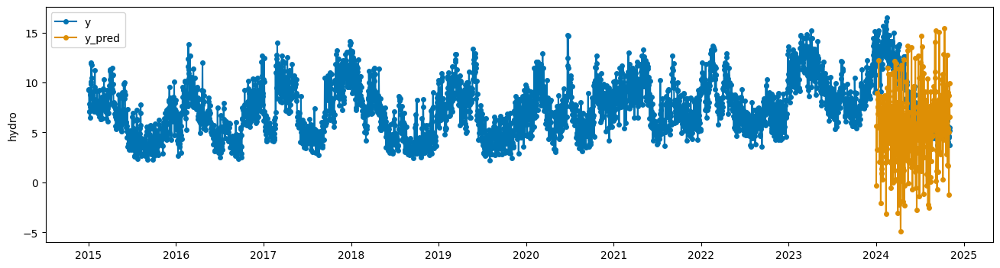

<Figure size 640x480 with 0 Axes>

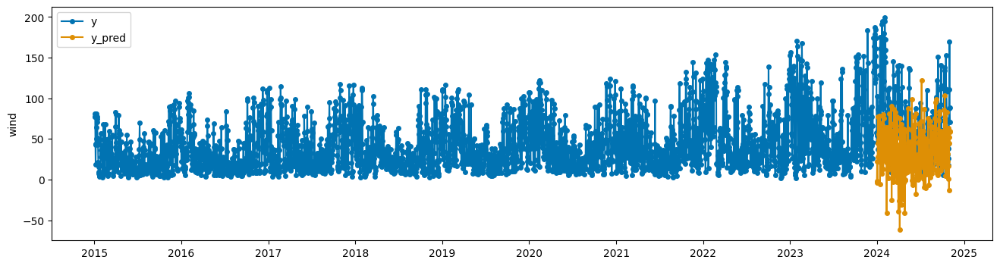

<Figure size 640x480 with 0 Axes>

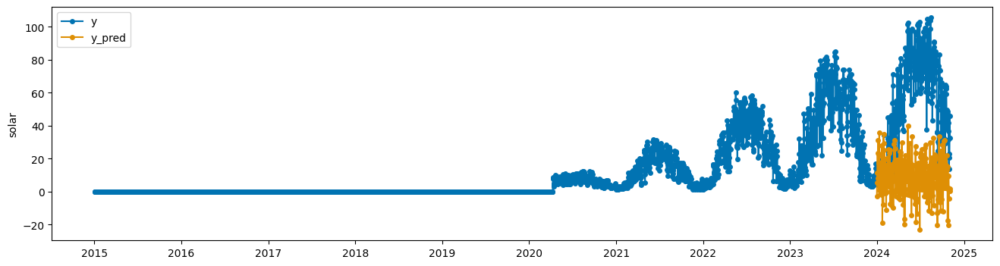

<Figure size 640x480 with 0 Axes>

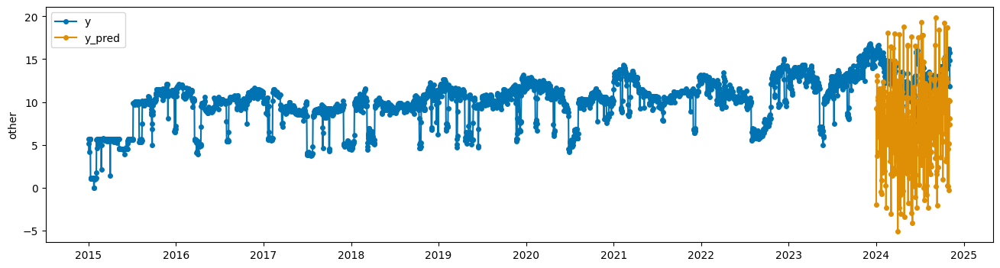

LTSFNLinearForecaster: 
score:  0.7744009753002681


<Figure size 640x480 with 0 Axes>

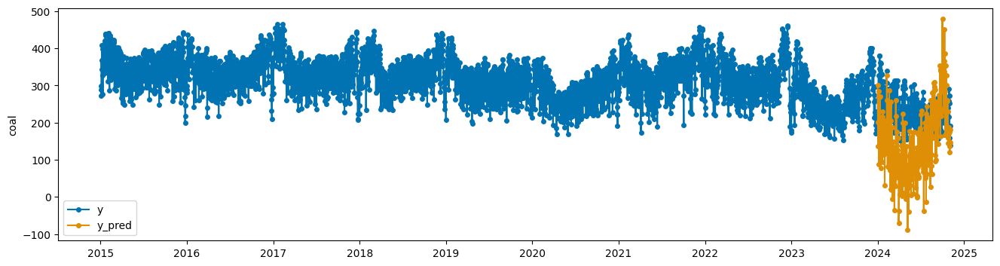

<Figure size 640x480 with 0 Axes>

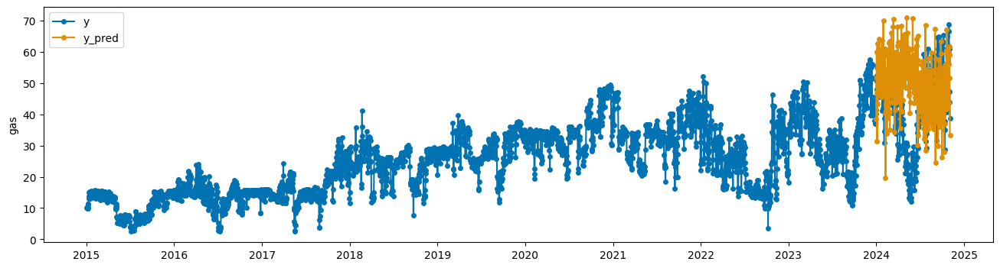

<Figure size 640x480 with 0 Axes>

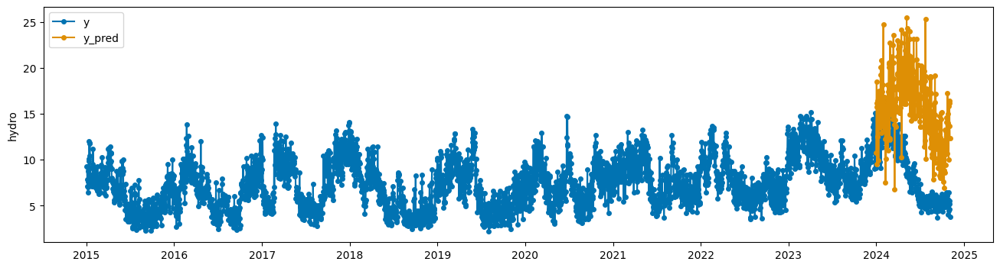

<Figure size 640x480 with 0 Axes>

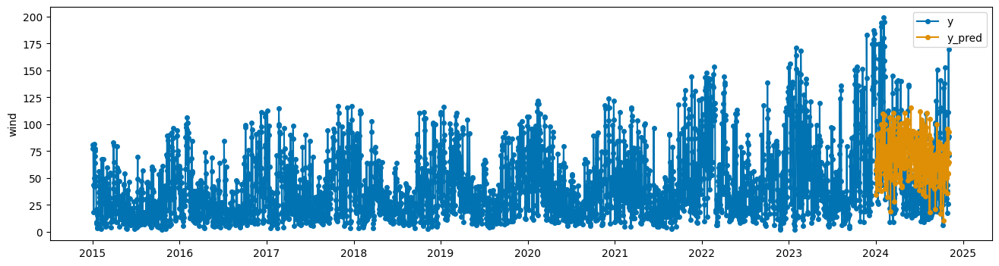

<Figure size 640x480 with 0 Axes>

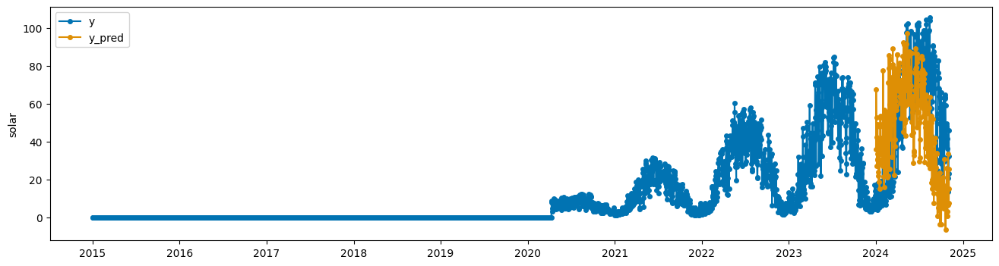

<Figure size 640x480 with 0 Axes>

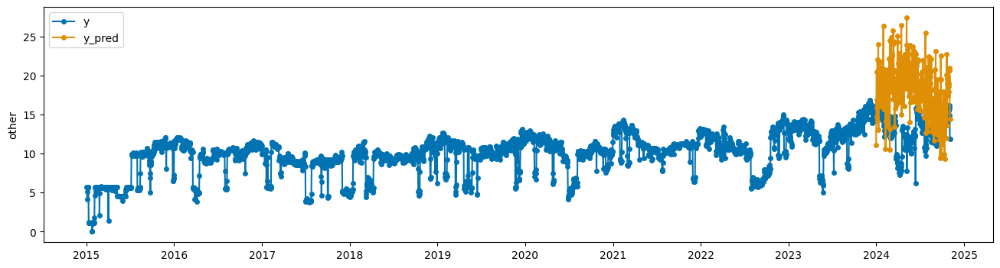

<Figure size 640x480 with 0 Axes>

In [17]:
train_linear_models(df_energy, df_energy_train, df_energy_test)

LTSFLinearForecaster: 
score:  1.5516226944516822


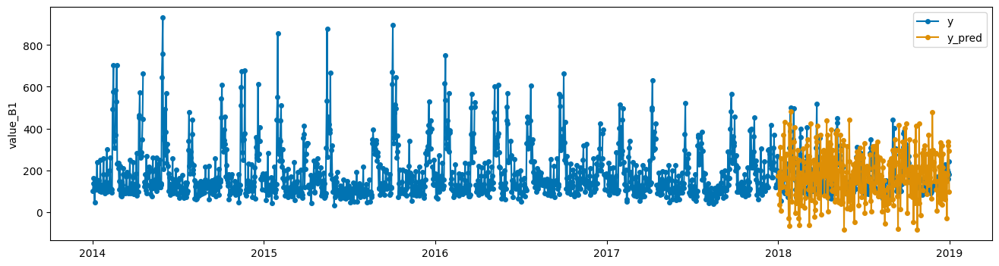

<Figure size 640x480 with 0 Axes>

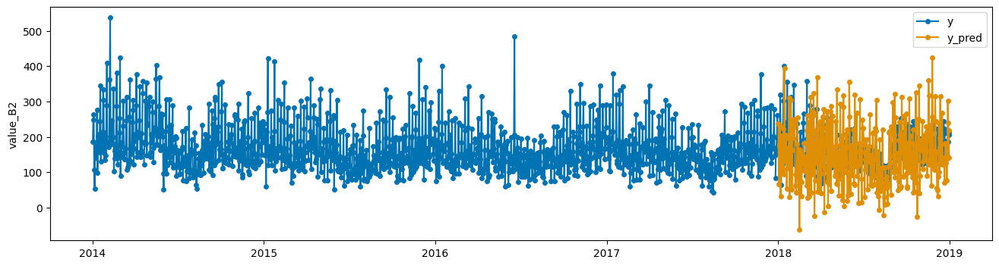

<Figure size 640x480 with 0 Axes>

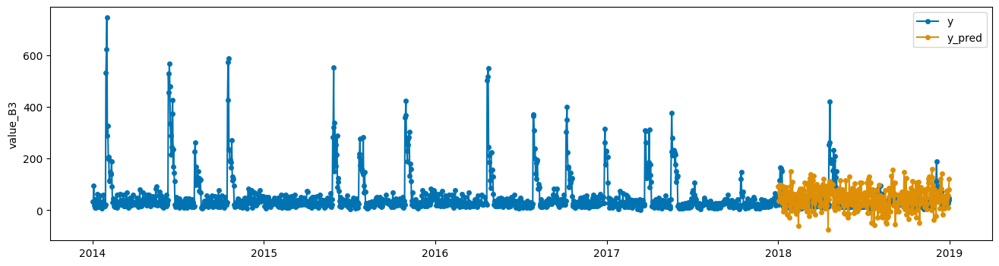

<Figure size 640x480 with 0 Axes>

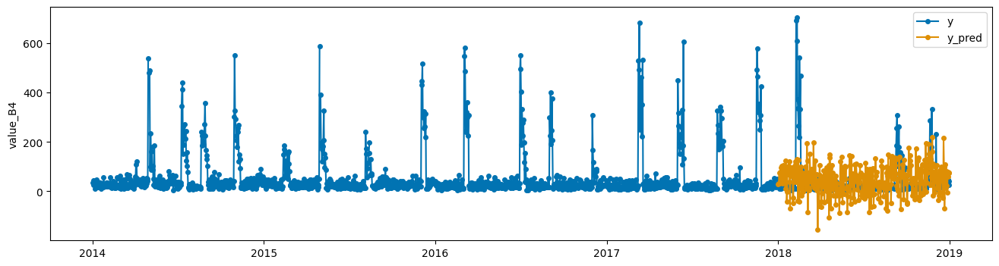

LTSFDLinearForecaster: 
score:  1.5381417220521025


<Figure size 640x480 with 0 Axes>

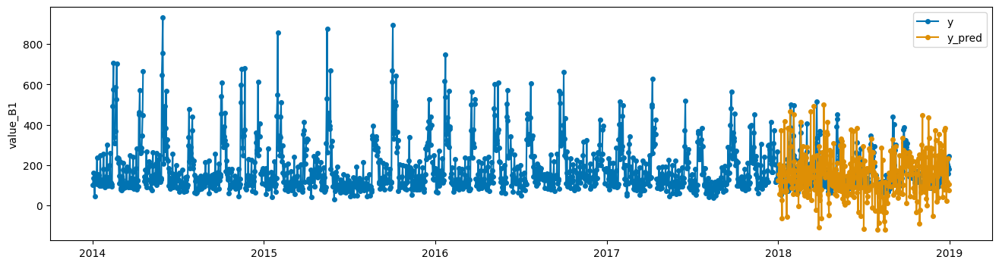

<Figure size 640x480 with 0 Axes>

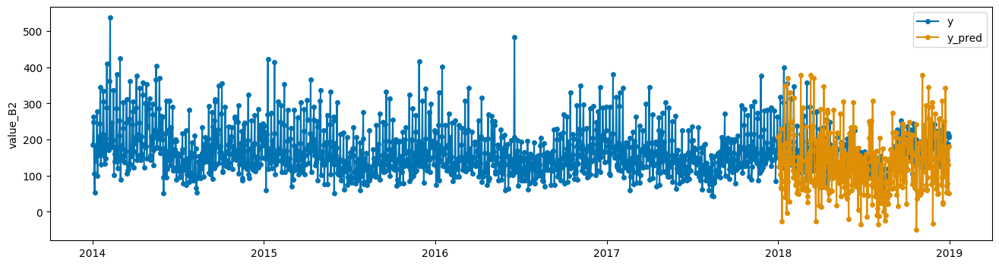

<Figure size 640x480 with 0 Axes>

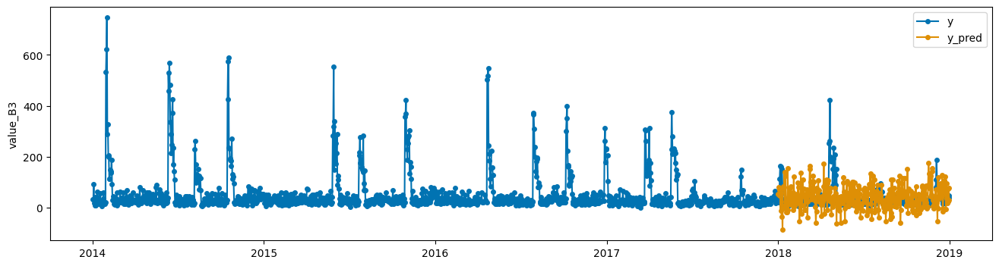

<Figure size 640x480 with 0 Axes>

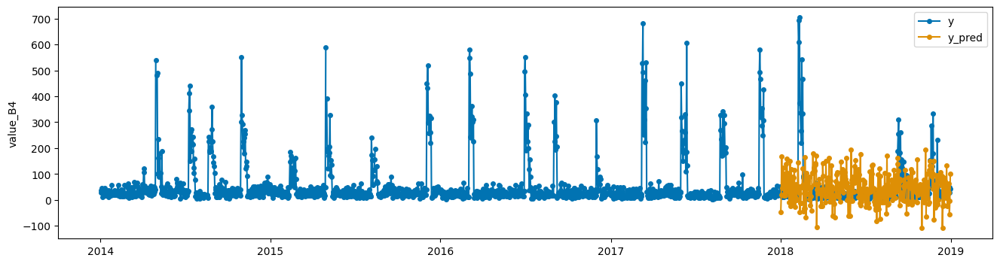

LTSFNLinearForecaster: 
score:  1.4880366077197107


<Figure size 640x480 with 0 Axes>

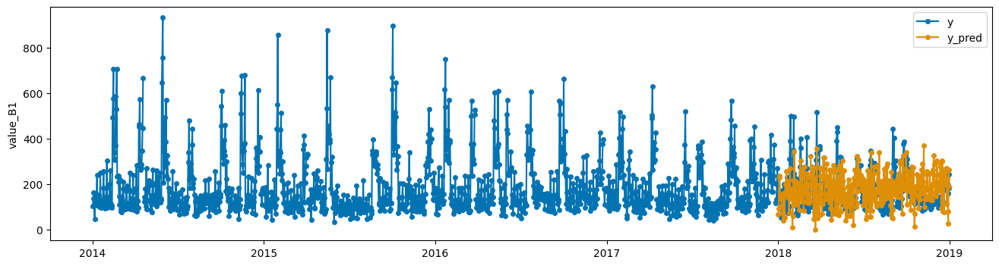

<Figure size 640x480 with 0 Axes>

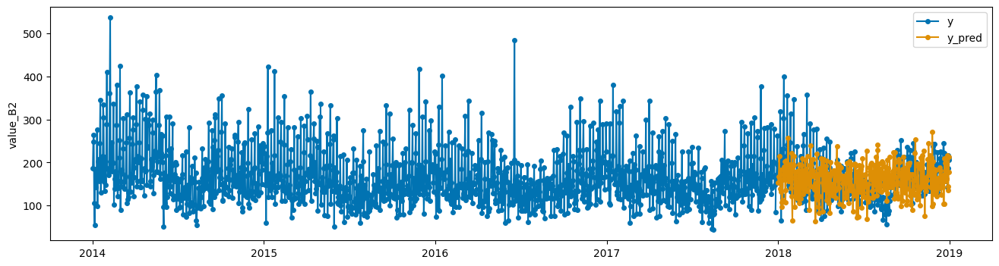

<Figure size 640x480 with 0 Axes>

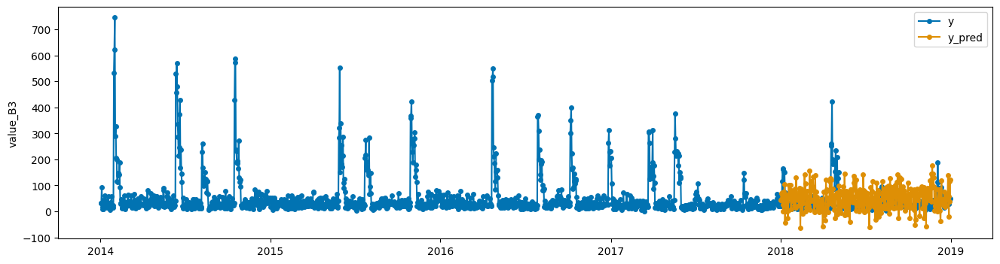

<Figure size 640x480 with 0 Axes>

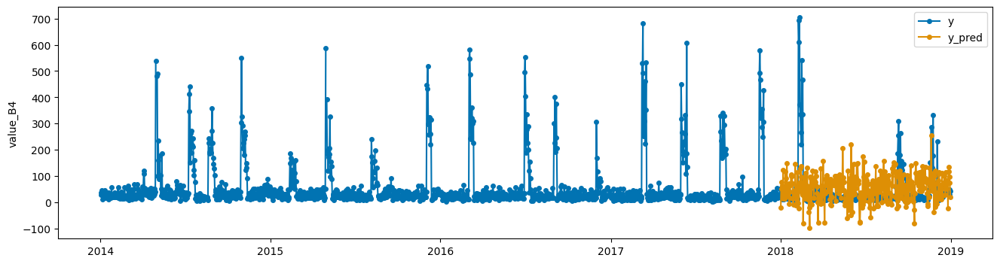

<Figure size 640x480 with 0 Axes>

In [18]:
train_linear_models(df_pasta, df_pasta_train, df_pasta_test)

### MLP-based models (2 points)

Implement MLP-based neural models:
- N-BEATS
- TSMixer

For N-BEATS, use the interpretable architecture variant. If you want to tune hyperparameters, you can use e.g. automated class from `neuralforecast` with Ray or Optuna frameworks.

Training each model on each dataset is worth 0.5 points. Useful libraries: `neuralforecast`, PyTorch, `pytorch-tsmixer`.

Other interesting MLP-based models are e.g. N-HiTS, TiDE, TimeMixer, SOFTS. Each additional model is graded like models above.

Useful references:
- ["N-BEATS: Neural basis expansion analysis for interpretable time series forecasting" B. Oreshkin et al.](https://arxiv.org/abs/1905.10437)
- ["TSMixer: An All-MLP Architecture for Time Series Forecasting" S. Chen et al.](https://arxiv.org/abs/2303.06053)
- ["N-HiTS: Neural Hierarchical Interpolation for Time Series Forecasting" C. Challu et al.](https://arxiv.org/abs/2201.12886)
- ["Long-term Forecasting with TiDE: Time-series Dense Encoder" A. Das et al.](https://arxiv.org/abs/2304.08424)
- ["TimeMixer: Decomposable Multiscale Mixing for Time Series Forecasting" S. Wang et al.](https://arxiv.org/abs/2405.14616)
- ["SOFTS: Efficient Multivariate Time Series Forecasting with Series-Core Fusion" L. Han et al.](https://arxiv.org/abs/2404.14197)
- [neuralforecast forecasting models list](https://nixtlaverse.nixtla.io/neuralforecast/docs/capabilities/overview.html)

In [19]:
from neuralforecast import NeuralForecast
from neuralforecast.models import NBEATS
from neuralforecast.losses.pytorch import DistributionLoss
from neuralforecast.losses.pytorch import MAE
from sklearn.metrics import r2_score, mean_absolute_error
from sktime.performance_metrics.forecasting import mean_absolute_scaled_error
from neuralforecast.models import TSMixer

In [20]:
# Data preparation

y_train_energy_mlp_based = df_energy_train.copy()
y_test_energy_mlp_based = df_energy_test.copy()
energy_source_labels = df_energy.columns

y_train_energy_mlp_based = wide_to_long_df(y_train_energy_mlp_based)
y_test_energy_mlp_based = wide_to_long_df(y_test_energy_mlp_based)


y_train_pasta_mlp_based = df_pasta_train.copy()
y_test_pasta_mlp_based = df_pasta_test.copy()
pasta_labels = df_pasta.columns

y_train_pasta_mlp_based = wide_to_long_df(y_train_pasta_mlp_based)
y_test_pasta_mlp_based = wide_to_long_df(y_test_pasta_mlp_based)


In [21]:
def calculate_scores_MLP_based(forecast, y_test, y_train, distinctive_label="NBEATS"):
    # print(forecasts_tsmixer)
    y_pred = forecast.loc[:, ["ds", distinctive_label]]
    y_pred = y_pred.set_index("ds")
    # print(y_pred)

    y_true = y_test.loc[:, ["ds", "y"]]
    y_true = y_true.set_index("ds")
    # print(y_true)

    y_train = y_train.loc[:, ["ds", "y"]]
    y_train = y_train.set_index("ds")
    # print(y_train)

    print("R^2 score: ", r2_score(y_true, y_pred))
    print("MAE score: ", mean_absolute_error(y_true, y_pred))
    print("MASE score: ", mean_absolute_scaled_error(y_true, y_pred, y_train=y_train))

In [22]:
def plot_multi_series_MLP_based(forecasts, labels, y_test, y_train, distinctive_label="NBEATS"):
    Y_hat_df = forecasts.reset_index(drop=False).drop(columns=['unique_id','ds'])
    plot_df = pd.concat([y_test, Y_hat_df], axis=1)
    plot_df = pd.concat([y_train, plot_df])

    for label in labels:
        plot_df_label = plot_df[plot_df.unique_id==label].drop('unique_id', axis=1)
        plt.plot(plot_df_label['ds'], plot_df_label['y'], label='True')
        plt.plot(plot_df_label['ds'], plot_df_label[distinctive_label], label='median')
        plt.grid()
        plt.legend()
        plt.title(label)
        plt.plot()
        plt.show()

In [23]:

def train_model_for_energy_NBEATS(y_train_mlp_based, y_test_mlp_based, energy_source_labels):
    print("Training NBEATS model for energy")
    model_nbeats = NBEATS(h=308, input_size=31,
                loss=MAE(),
                stack_types = ['identity', 'trend', 'seasonality'],
                max_steps=300,
                val_check_steps=30,
                early_stop_patience_steps=2,
                learning_rate=5e-5)

    fcst_nbeats = NeuralForecast(
        models=[model_nbeats],
        freq='D'
    )

    fcst_nbeats.fit(df=y_train_mlp_based, val_size=308)
    forecasted_nbeats = fcst_nbeats.predict(futr_df=y_test_mlp_based)
    # print(forecasted_nbeats)

    calculate_scores_MLP_based(forecasted_nbeats, y_test_mlp_based, y_train_mlp_based)
    plot_multi_series_MLP_based(forecasted_nbeats, energy_source_labels, y_test_mlp_based, y_train_mlp_based)

def train_model_for_energy_TSMixer(y_train_mlp_based, y_test_mlp_based, energy_source_labels):
    print("Training TSMixer model for energy")
    model_tsmixer = TSMixer(h=308,
                input_size=31,
                n_series=6, 
                n_block=6,
                ff_dim=6,
                dropout=0,
                revin=True,
                scaler_type='standard',
                max_steps=300,
                early_stop_patience_steps=5,
                val_check_steps=30,
                learning_rate=1e-3,
                loss=MAE(),
                valid_loss=MAE(),
                batch_size=32
                )

    fcst_tsmixer = NeuralForecast(
        models=[model_tsmixer], 
        freq='D'
    )

    fcst_tsmixer.fit(df=y_train_mlp_based, val_size=308)
    forecasted_tsmixer = fcst_tsmixer.predict(futr_df=y_test_mlp_based)
    # print(forecasted_tsmixer)

    calculate_scores_MLP_based(forecasted_tsmixer, y_test_mlp_based, y_train_mlp_based, distinctive_label="TSMixer")
    plot_multi_series_MLP_based(forecasted_tsmixer, energy_source_labels, y_test_mlp_based, y_train_mlp_based, distinctive_label="TSMixer")


def train_model_for_energy():

    train_model_for_energy_NBEATS(y_train_energy_mlp_based, y_test_energy_mlp_based, energy_source_labels)
    train_model_for_energy_TSMixer(y_train_energy_mlp_based, y_test_energy_mlp_based, energy_source_labels)


In [24]:
def train_model_for_pasta_NBEATS(y_train_mlp_based, y_test_mlp_based, pasta_types_labels):
    print("Training NBEATS model for pasta")
    model_nbeats = NBEATS(h=365, input_size=31,
                loss=MAE(),
                stack_types = ['identity', 'trend', 'seasonality'],
                max_steps=300,
                val_check_steps=30,
                early_stop_patience_steps=2,
                learning_rate=5e-5)

    fcst_nbeats = NeuralForecast(
        models=[model_nbeats],
        freq='D'
    )

    fcst_nbeats.fit(df=y_train_mlp_based, val_size=365)
    forecasted_nbeats = fcst_nbeats.predict(futr_df=y_test_mlp_based)

    calculate_scores_MLP_based(forecasted_nbeats, y_test_mlp_based, y_train_mlp_based)
    plot_multi_series_MLP_based(forecasted_nbeats, pasta_types_labels, y_test_mlp_based, y_train_mlp_based)

def train_model_for_pasta_TSMixer(y_train_mlp_based, y_test_mlp_based, pasta_types_labels):
    print("Training TSMixer model for pasta")
    model_tsmixer = TSMixer(h=365,
                input_size=31,
                n_series=4, 
                n_block=4,
                ff_dim=4,
                dropout=0.2,
                revin=True,
                scaler_type='standard',
                max_steps=300,
                early_stop_patience_steps=5,
                val_check_steps=30,
                learning_rate=1e-3,
                loss=MAE(),
                valid_loss=MAE(),
                batch_size=32
                )

    fcst_tsmixer = NeuralForecast(
        models=[model_tsmixer], 
        freq='D'
    )

    fcst_tsmixer.fit(df=y_train_mlp_based, val_size=365)
    forecasted_tsmixer = fcst_tsmixer.predict(futr_df=y_test_mlp_based)
    # print(forecasted_tsmixer)

    calculate_scores_MLP_based(forecasted_tsmixer, y_test_mlp_based, y_train_mlp_based, distinctive_label="TSMixer")
    plot_multi_series_MLP_based(forecasted_tsmixer, pasta_types_labels, y_test_mlp_based, y_train_mlp_based, distinctive_label="TSMixer")


def train_model_for_pasta():

    train_model_for_pasta_NBEATS(y_train_pasta_mlp_based, y_test_pasta_mlp_based, pasta_labels)
    train_model_for_pasta_TSMixer(y_train_pasta_mlp_based, y_test_pasta_mlp_based, pasta_labels)


Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params
-----------------------------------------------
0 | loss         | MAE           | 0     
1 | padder_train | ConstantPad1d | 0     
2 | scaler       | TemporalNorm  | 0     
3 | blocks       | ModuleList    | 3.4 M 
-----------------------------------------------
3.2 M     Trainable params
209 K     Non-trainable params
3.4 M     Total params
13.717    Total estimated model params size (MB)


Training NBEATS model for energy


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

R^2 score:  0.6647300159877814
MAE score:  35.20484503630023
MASE score:  3.7894116792708523


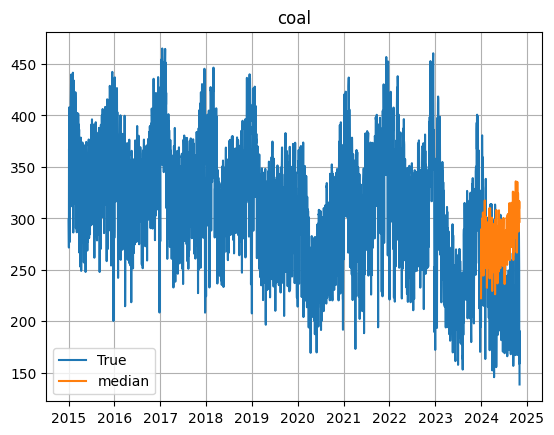

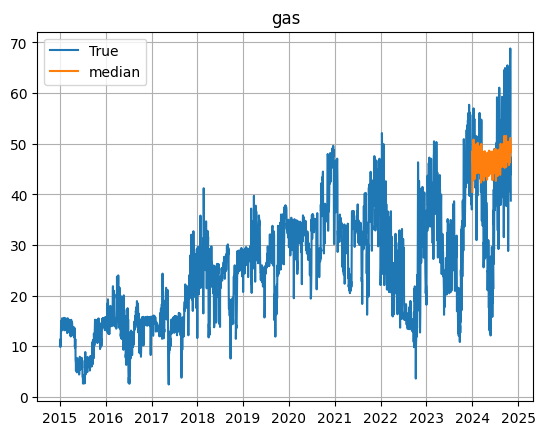

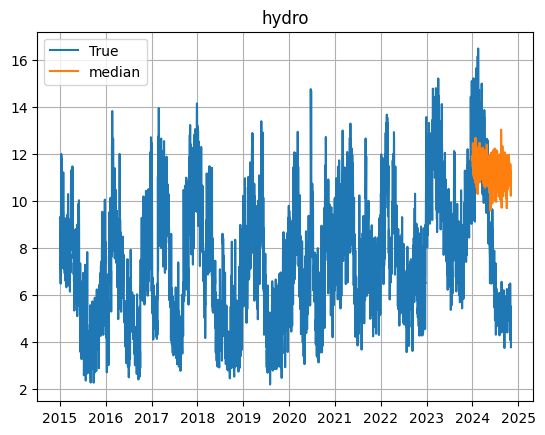

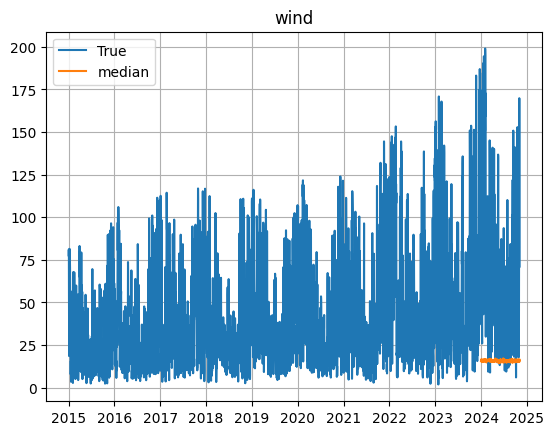

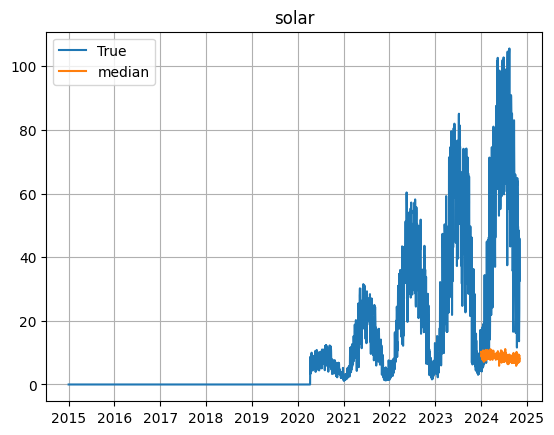

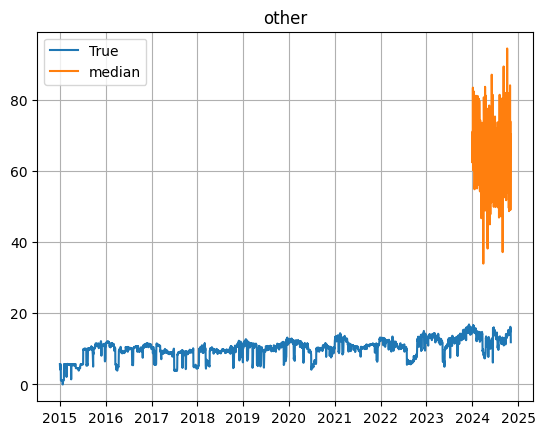

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type                     | Params
-----------------------------------------------------------
0 | loss          | MAE                      | 0     
1 | valid_loss    | MAE                      | 0     
2 | padder        | ConstantPad1d            | 0     
3 | scaler        | TemporalNorm             | 0     
4 | norm          | ReversibleInstanceNorm1d | 12    
5 | mixing_layers | Sequential               | 10.9 K
6 | out           | Linear                   | 9.9 K 
-----------------------------------------------------------
20.8 K    Trainable params
0         Non-trainable params
20.8 K    Total params
0.083     Total estimated model params size (MB)


Training TSMixer model for energy


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=300` reached.
Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

R^2 score:  0.7059662700314062
MAE score:  32.4758296474977
MASE score:  3.495663396141781


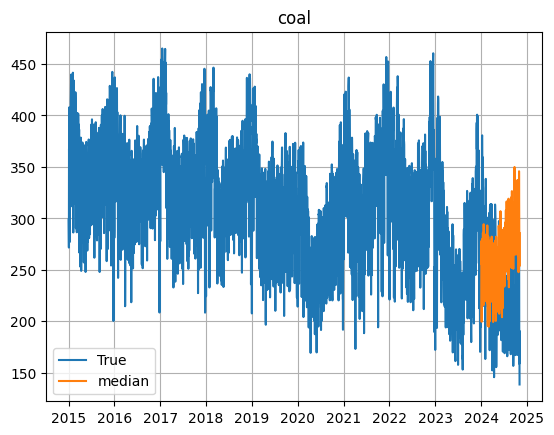

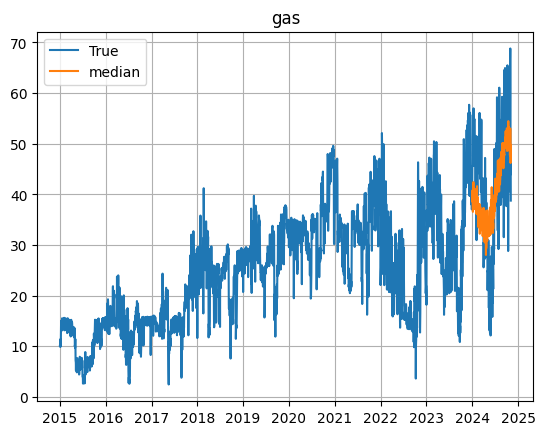

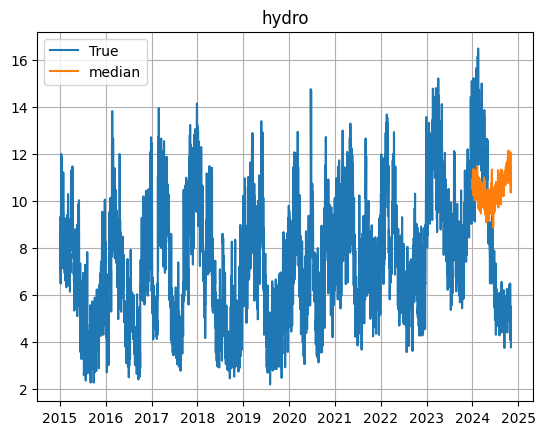

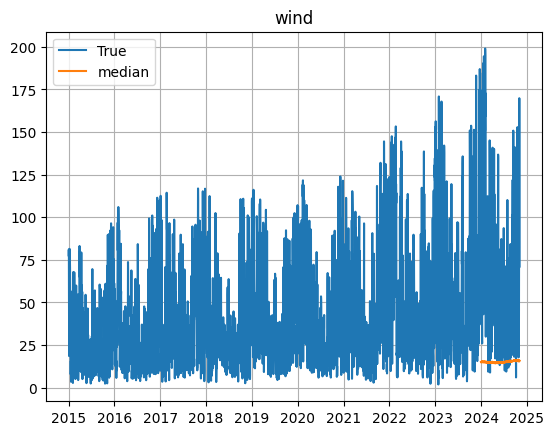

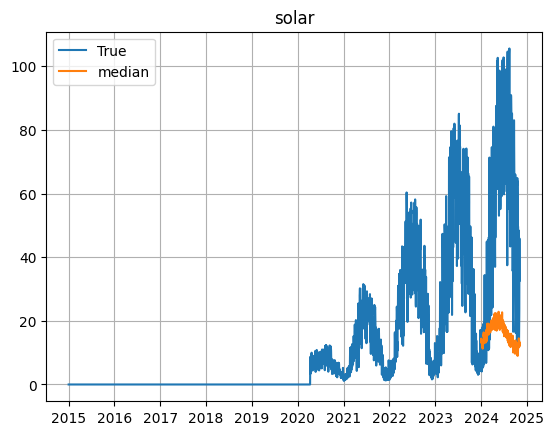

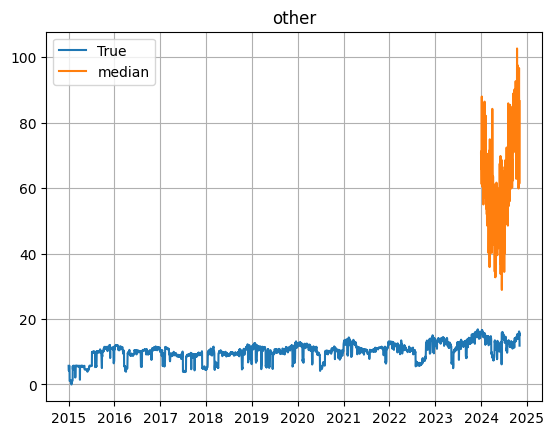

In [25]:
train_model_for_energy()

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name         | Type          | Params
-----------------------------------------------
0 | loss         | MAE           | 0     
1 | padder_train | ConstantPad1d | 0     
2 | scaler       | TemporalNorm  | 0     
3 | blocks       | ModuleList    | 3.7 M 
-----------------------------------------------
3.4 M     Trainable params
289 K     Non-trainable params
3.7 M     Total params
14.623    Total estimated model params size (MB)


Training NBEATS model for pasta


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

R^2 score:  0.42575110690718365
MAE score:  39.14086563815809
MASE score:  0.9082991787566226


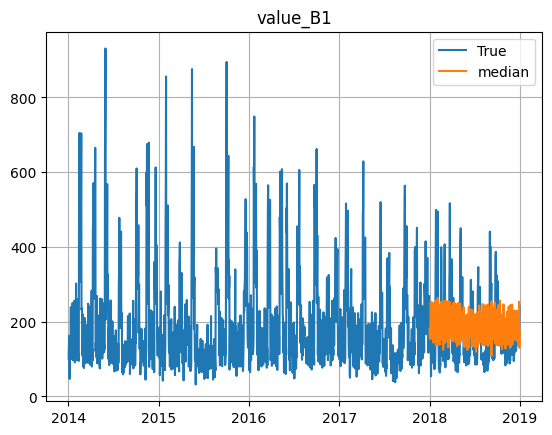

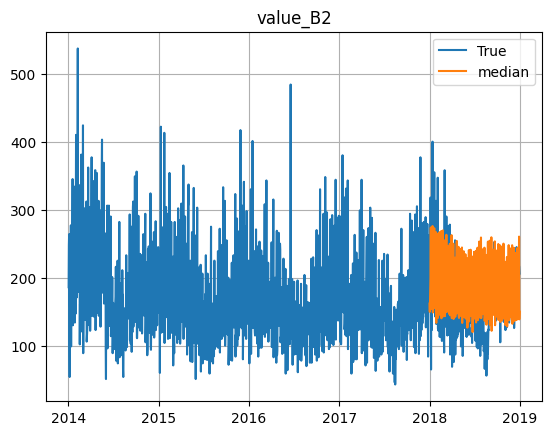

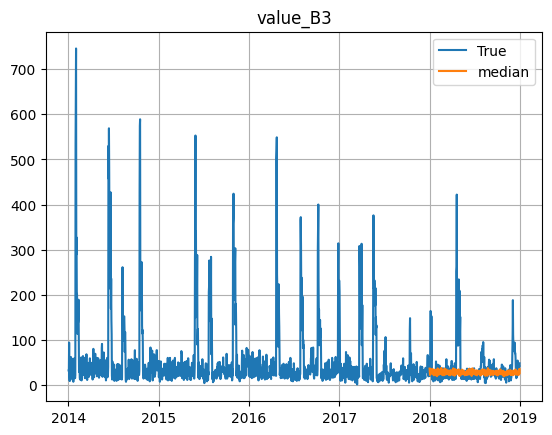

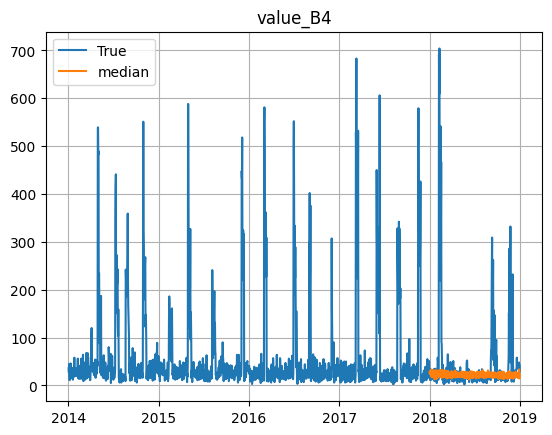

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name          | Type                     | Params
-----------------------------------------------------------
0 | loss          | MAE                      | 0     
1 | valid_loss    | MAE                      | 0     
2 | padder        | ConstantPad1d            | 0     
3 | scaler        | TemporalNorm             | 0     
4 | norm          | ReversibleInstanceNorm1d | 8     
5 | mixing_layers | Sequential               | 6.1 K 
6 | out           | Linear                   | 11.7 K
-----------------------------------------------------------
17.8 K    Trainable params
0         Non-trainable params
17.8 K    Total params
0.071     Total estimated model params size (MB)


Training TSMixer model for pasta


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=300` reached.
Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

R^2 score:  0.43034374531251207
MAE score:  36.83787752830819
MASE score:  0.854856257279085


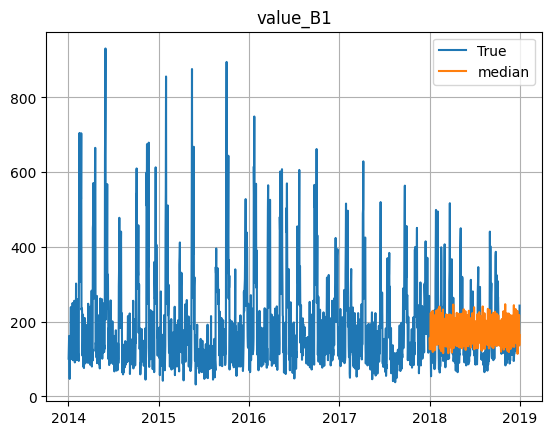

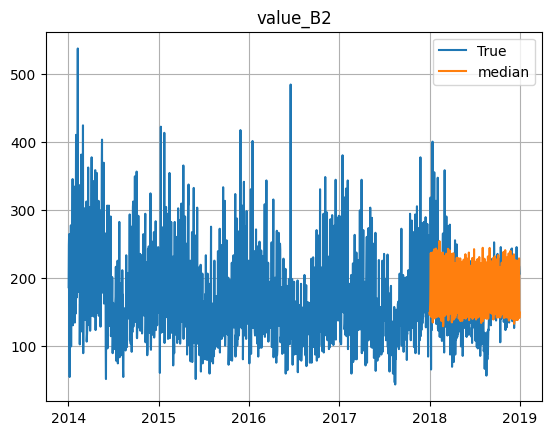

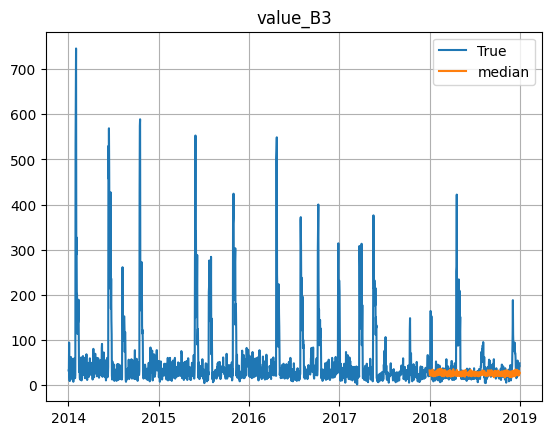

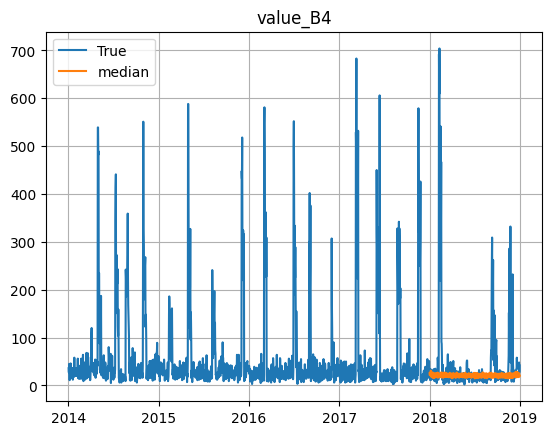

In [26]:
train_model_for_pasta()

### Time series transformers (2 points)

Implement a time series transformer, e.g. PatchTST.

You can use either pretrained variant, or train from scratch. If you want to tune hyperparameters, you can use e.g. automated class from `neuralforecast` with Ray or Optuna frameworks.

Training the model in any way is worth 2 points. You can also choose any other time series transformer, e.g. TFT, iTransformer, Autoformer. Useful libraries: `neuralforecast`, PyTorch, `transformers`, IBM Granite. Each model after the first one is worth 1 point. If you use PatchTST, using the pretrained one and training from scratch counts as two separate models.

Useful references:
- ["A Time Series is Worth 64 Words: Long-term Forecasting with Transformers" Y. Nie et al.](https://arxiv.org/abs/2211.14730)
- ["Temporal Fusion Transformers for Interpretable Multi-horizon Time Series Forecasting" B. Lim et al.](https://arxiv.org/abs/1912.09363)
- ["iTransformer: Inverted Transformers Are Effective for Time Series Forecasting" Y. Liu et al.](https://arxiv.org/abs/2310.06625)
- ["Autoformer: Decomposition Transformers with Auto-Correlation for Long-Term Series Forecasting" H. Wu et al.](https://arxiv.org/abs/2106.13008)
- [neuralforecast forecasting models list](https://nixtlaverse.nixtla.io/neuralforecast/docs/capabilities/overview.html)
- [IBM Granite tutorial for pretrained PatchTST](https://github.com/ibm-granite/granite-tsfm/blob/main/notebooks/hfdemo/patch_tst_getting_started.ipynb)

In [27]:
from neuralforecast.models import PatchTST

In [28]:
def train_model_for_energy_patchTST(y_train_mlp_based, y_test_mlp_based, energy_source_labels):
    y_train_mlp_based = df_energy_train.copy()
    y_test_mlp_based = df_energy_test.copy()
    energy_source_labels = df_energy.columns

    y_train_mlp_based = wide_to_long_df(y_train_mlp_based)
    y_test_mlp_based = wide_to_long_df(y_test_mlp_based)

    model = PatchTST(h=308,
                 input_size=31,
                 patch_len=365,
                 stride=31,
                 dropout=0,
                 revin=False,
                 hidden_size=16,
                 n_heads=4,
                 scaler_type='robust',
                 loss=MAE(),
                 learning_rate=5e-5,
                 max_steps=300,
                 val_check_steps=30,
                 early_stop_patience_steps=3)

    fcst_ptst = NeuralForecast(
        models=[model],
        freq='D'
    )
    fcst_ptst.fit(df=y_train_mlp_based, val_size=308)
    forecasted_pTST = fcst_ptst.predict(futr_df=y_test_mlp_based)

    calculate_scores_MLP_based(forecasted_pTST, y_test_mlp_based, y_train_mlp_based, distinctive_label="PatchTST")
    plot_multi_series_MLP_based(forecasted_pTST, energy_source_labels, y_test_mlp_based, y_train_mlp_based, distinctive_label="PatchTST")


In [29]:
def train_model_for_pasta_patchTST(y_train_mlp_based, y_test_mlp_based, pasta_labels):
    y_train_mlp_based = df_pasta_train.copy()
    y_test_mlp_based = df_pasta_test.copy()
    pasta_labels = df_pasta.columns

    y_train_mlp_based = wide_to_long_df(y_train_mlp_based)
    y_test_mlp_based = wide_to_long_df(y_test_mlp_based)

    model = PatchTST(h=365,
                 input_size=31,
                 patch_len=365,
                 stride=31,
                 dropout=0,
                 revin=False,
                 hidden_size=16,
                 n_heads=4,
                 scaler_type='robust',
                 loss=MAE(),
                 learning_rate=5e-5,
                 max_steps=300,
                 val_check_steps=30,
                 early_stop_patience_steps=3)

    fcst_ptst = NeuralForecast(
        models=[model],
        freq='D'
    )
    fcst_ptst.fit(df=y_train_mlp_based, val_size=365)
    forecasted_pTST = fcst_ptst.predict(futr_df=y_test_mlp_based)

    calculate_scores_MLP_based(forecasted_pTST, y_test_mlp_based, y_train_mlp_based, distinctive_label="PatchTST")
    plot_multi_series_MLP_based(forecasted_pTST, pasta_labels, y_test_mlp_based, y_train_mlp_based, distinctive_label="PatchTST")

Seed set to 1


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name         | Type              | Params
---------------------------------------------------
0 | loss         | MAE               | 0     
1 | padder_train | ConstantPad1d     | 0     
2 | scaler       | TemporalNorm      | 0     
3 | model        | PatchTST_backbone | 35.1 K
---------------------------------------------------
35.1 K    Trainable params
3         Non-trainable params
35.1 K    Total params
0.140     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=300` reached.
Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

R^2 score:  0.5574304083819828
MAE score:  41.04227206602447
MASE score:  4.417746050307558


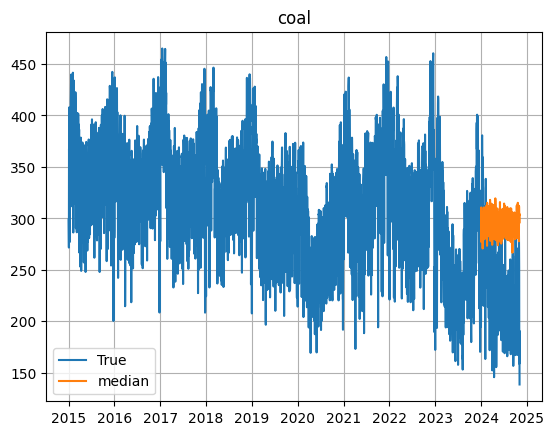

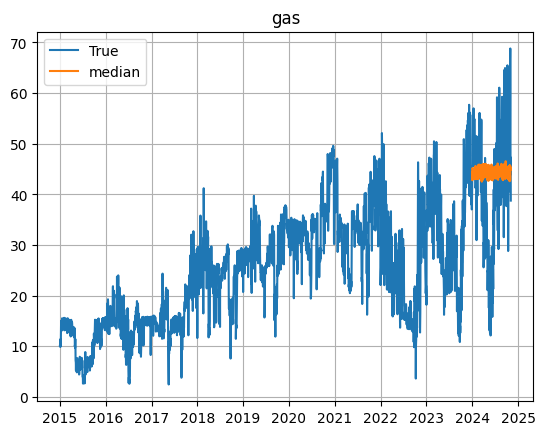

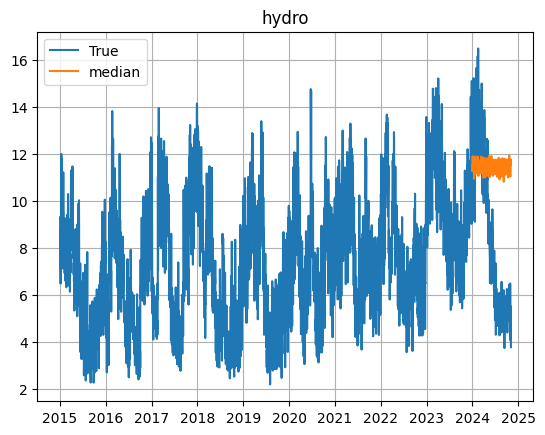

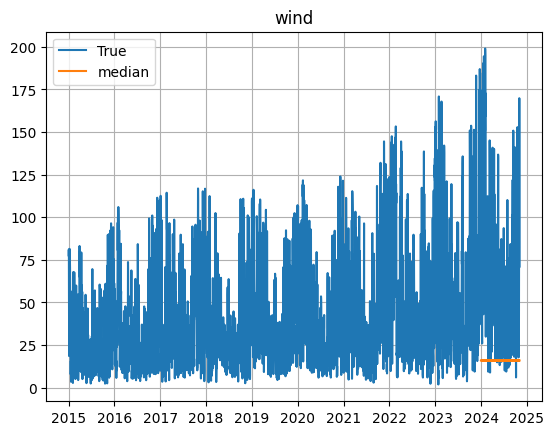

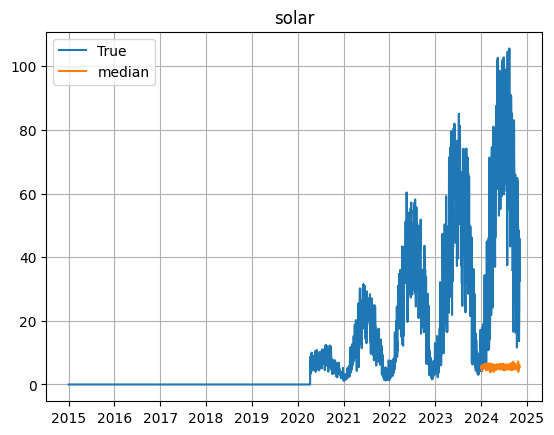

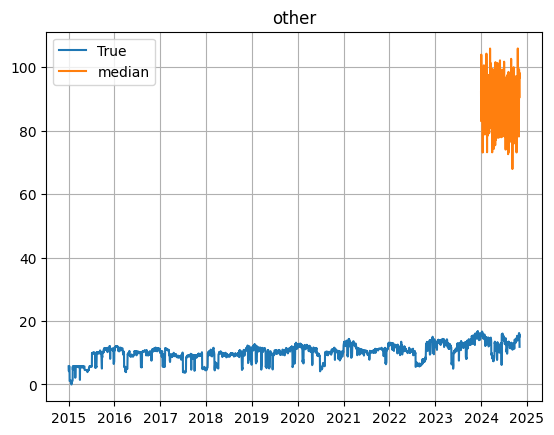

In [30]:
train_model_for_energy_patchTST(y_train_energy_mlp_based, y_test_energy_mlp_based, energy_source_labels)

Seed set to 1
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name         | Type              | Params
---------------------------------------------------
0 | loss         | MAE               | 0     
1 | padder_train | ConstantPad1d     | 0     
2 | scaler       | TemporalNorm      | 0     
3 | model        | PatchTST_backbone | 36.1 K
---------------------------------------------------
36.1 K    Trainable params
3         Non-trainable params
36.1 K    Total params
0.144     Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=300` reached.
Trainer already configured with model summary callbacks: [<class 'pytorch_lightning.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

R^2 score:  0.3927433280382632
MAE score:  41.30809288939385
MASE score:  0.9585916467534812


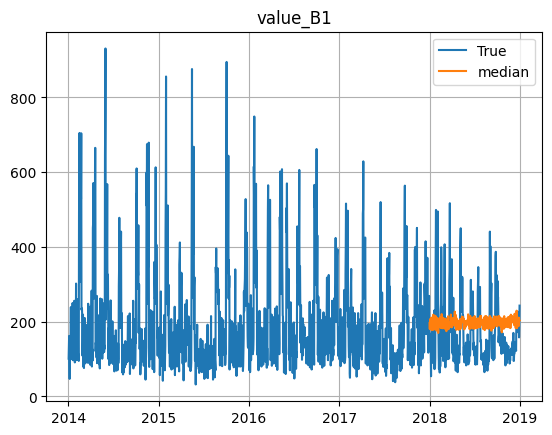

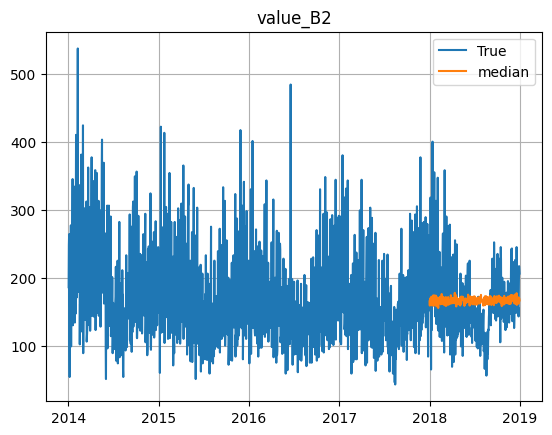

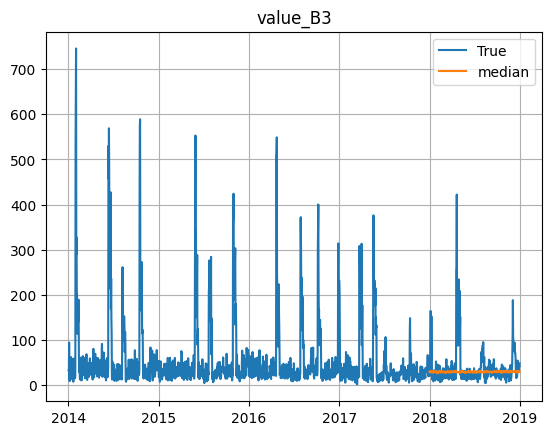

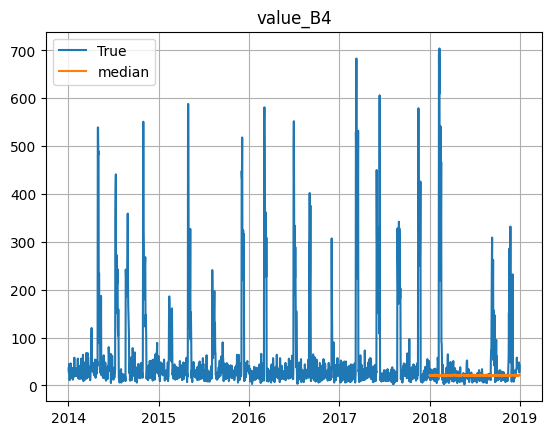

In [31]:
train_model_for_pasta_patchTST(y_train_pasta_mlp_based, y_test_pasta_mlp_based, pasta_labels)

### Pretrained foundation models (2 points)

Use a pretrained time series foundation model for zero-shot forecasting.

Examples are e.g. TimesFM, Lag-Llama, TimeGPT, Moirai. Model notes:
1. TimesFM - using the PyTorch version of original library is suggested
2. Lag-Llama - this is a probabilistic model, note that we are interested in point forecasts (mean probabilistic value)
3. TimeGPT - as this is a proprietary model, you need to provide the API token, make sure you don't push it to a public repository!

The first model is worth 2 points, and subsequent ones are worth 1 point each.

Useful references:
- ["A decoder-only foundation model for time-series forecasting" A. Das et al.](https://arxiv.org/abs/2310.10688)
- [TimesFM repository](https://github.com/google-research/timesfm)
- ["Lag-Llama: Towards Foundation Models for Probabilistic Time Series Forecasting" K. Rasul et al.](https://arxiv.org/abs/2310.08278)
- [Lag-Llama repository](https://github.com/time-series-foundation-models/lag-llama)
- ["TimeGPT-1" A. Garza et al.](https://arxiv.org/abs/2310.03589)
- [TimeGPT docs](https://docs.nixtla.io/)
- ["Unified Training of Universal Time Series Forecasting Transformers" G. Woo et al.](https://arxiv.org/abs/2402.02592)
- [HuggingFace Moirai model page](https://huggingface.co/Salesforce/moirai-1.0-R-large)

In [32]:
import torch
import timesfm

TimesFM v1.2.0. See https://github.com/google-research/timesfm/blob/master/README.md for updated APIs.
Loaded Jax TimesFM.
Loaded PyTorch TimesFM.


In [33]:
def use_timesfm_pretrained_for_energy(y_train, y_test, labels):
    tfm = timesfm.TimesFm(
        hparams=timesfm.TimesFmHparams(
            backend="cpu",
            per_core_batch_size=32,
            horizon_len=308,
        ),
        checkpoint=timesfm.TimesFmCheckpoint(
            huggingface_repo_id="google/timesfm-1.0-200m-pytorch"),
    )

    forecasted_tfm = tfm.forecast_on_df(
        inputs=y_train,
        freq="D",
        value_name="y",
        num_jobs=-1,
    )

    calculate_scores_MLP_based(forecasted_tfm, y_test, y_train, distinctive_label="timesfm")
    plot_multi_series_MLP_based(forecasted_tfm, labels, y_test, y_train, distinctive_label="timesfm")

In [34]:
def use_timesfm_pretrained_for_pasta(y_train, y_test, labels):
    tfm = timesfm.TimesFm(
        hparams=timesfm.TimesFmHparams(
            backend="cpu",
            per_core_batch_size=32,
            horizon_len=365,
        ),
        checkpoint=timesfm.TimesFmCheckpoint(
            huggingface_repo_id="google/timesfm-1.0-200m-pytorch"),
    )

    forecasted_tfm = tfm.forecast_on_df(
        inputs=y_train,
        freq="D",
        value_name="y",
        num_jobs=-1,
    )

    # print(forecasted_tfm)
    calculate_scores_MLP_based(forecasted_tfm, y_test, y_train, distinctive_label="timesfm")
    plot_multi_series_MLP_based(forecasted_tfm, labels, y_test, y_train, distinctive_label="timesfm")

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
R^2 score:  0.7361943262034896
MAE score:  30.107730047213565
MASE score:  3.240763700553279


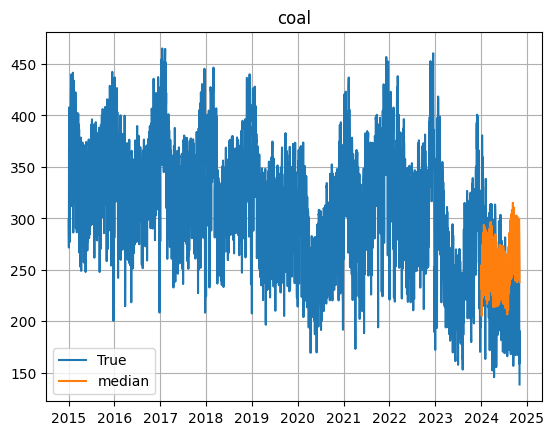

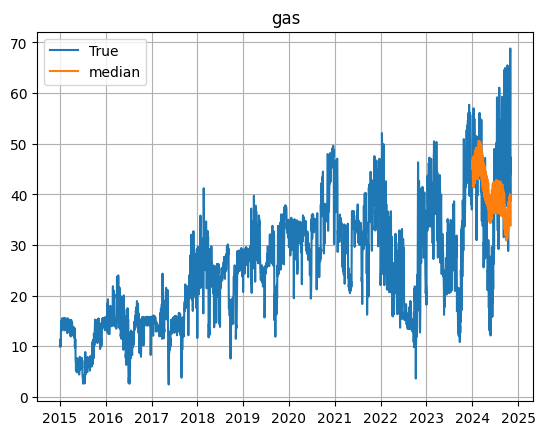

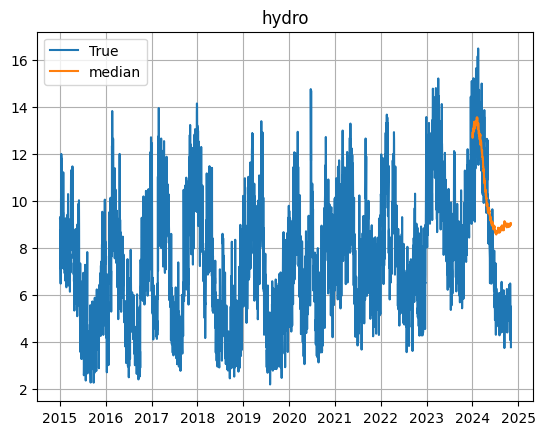

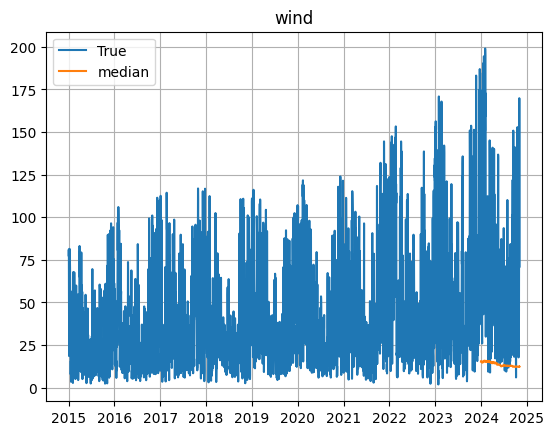

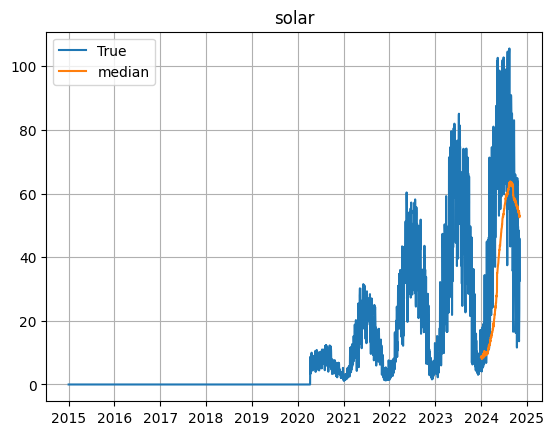

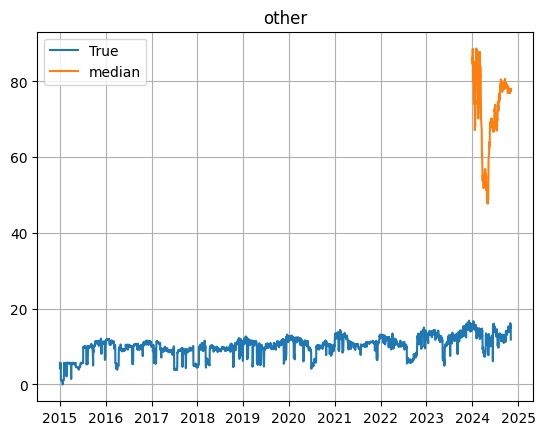

In [35]:
use_timesfm_pretrained_for_energy(y_train_energy_mlp_based, y_test_energy_mlp_based, energy_source_labels)

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

Processing dataframe with multiple processes.
Finished preprocessing dataframe.
Finished forecasting.
R^2 score:  0.4156846723381301
MAE score:  38.56568553349743
MASE score:  0.8949516043434724


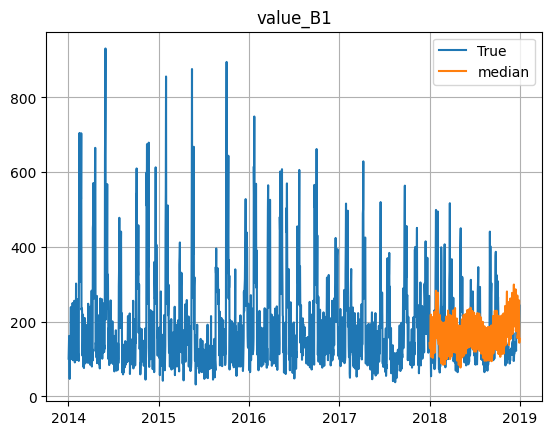

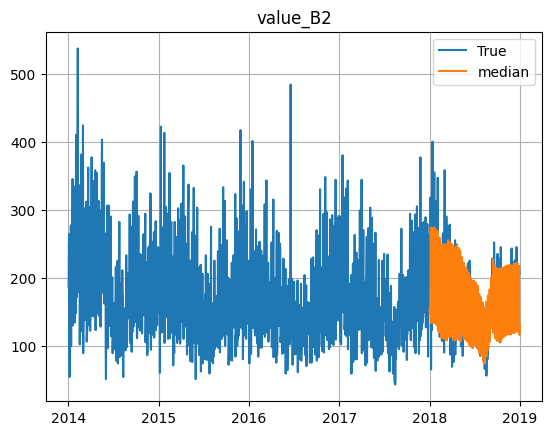

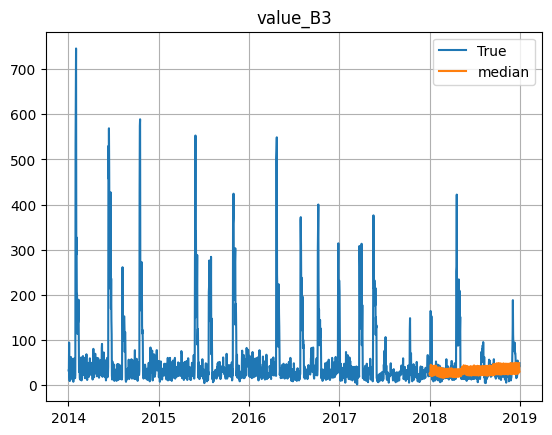

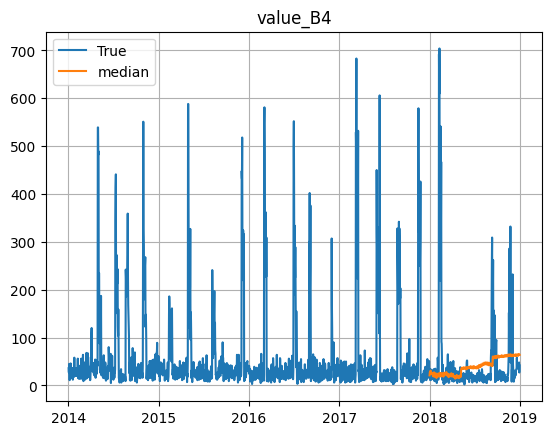

In [36]:
use_timesfm_pretrained_for_pasta(y_train_pasta_mlp_based, y_test_pasta_mlp_based, pasta_labels)

In [ ]:
import pandas as pd
from nixtla import NixtlaClient
from utilsforecast.losses import mae

nixtla_client = NixtlaClient(api_key = '')

In [38]:
def use_TimeGPT_for_energy(y_train_energy_mlp_based, y_test_energy_mlp_based):
    fcst_df = nixtla_client.forecast(
        y_train_energy_mlp_based, 
        h=308, 
        level=[80, 90], 
        freq='D',
        finetune_steps=5,
        finetune_loss='mae',
        time_col='ds', 
        target_col='y')

    nixtla_client.plot(pd.concat([y_train_energy_mlp_based, y_test_energy_mlp_based]), fcst_df, level=[80, 90])
    
    test = y_test_energy_mlp_based.copy()
    test = test.set_index("ds")
    test['TimeGPT'] = fcst_df['TimeGPT'].values
    evaluation = mae(test, models=['TimeGPT'], id_col='unique_id', target_col='y')

    print(evaluation)

In [39]:
def use_TimeGPT_for_pasta(y_train_pasta_mlp_based, y_test_pasta_mlp_based):
    fcst_df = nixtla_client.forecast(
        y_train_pasta_mlp_based, 
        h=365, 
        level=[80, 90], 
        freq='D',
        finetune_steps=5,
        finetune_loss='mae',
        time_col='ds', 
        target_col='y')

    nixtla_client.plot(pd.concat([y_train_pasta_mlp_based, y_test_pasta_mlp_based]), fcst_df, level=[80, 90])
    
    test = y_test_pasta_mlp_based.copy()
    test = test.set_index("ds")
    test['TimeGPT'] = fcst_df['TimeGPT'].values
    evaluation = mae(test, models=['TimeGPT'], id_col='unique_id', target_col='y')

    print(evaluation)

In [40]:
use_TimeGPT_for_energy(y_train_energy_mlp_based, y_test_energy_mlp_based)

  unique_id    TimeGPT
0      coal  27.822526
1       gas   9.188669
2     hydro   3.671135
3     other  98.763825
4     solar  44.245768
5      wind  46.906733


In [41]:
use_TimeGPT_for_pasta(y_train_pasta_mlp_based, y_test_pasta_mlp_based)

  unique_id    TimeGPT
0  value_B1  79.964938
1  value_B2  64.871888
2  value_B3  20.630309
3  value_B4  31.592214
